In [2]:
import numpy as np
import matplotlib.pyplot as plt
from coffea import util
from coffea.processor import accumulate
import hist
import os
import sys
import re
import pandas as pd
sys.path.append("/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools")
import plotTools as ptools

# Cutflow plots

In [3]:
f_sig = "signal_2018_aEM_ejdR_rejection_IDcut.coffea"
sig = util.load(f_sig)[0]

bkg_files = {
    "QCD":"bkg_2018_QCD_TuneCP5_PSWeights_ejdR_rejection_IDcut.coffea",
    "Top":"bkg_2018_Top_ejdR_rejection_IDcut.coffea",
    "DY":"bkg_2018_DY_ejdR_rejection_IDcut.coffea",
    "Diboson":"bkg_2018_Diboson_ejdR_rejection_IDcut.coffea",
    "Triboson":"bkg_2018_Triboson_ejdR_rejection_IDcut.coffea",
    "W+jets":"bkg_2018_WJets_ejdR_rejection_IDcut.coffea",
    "Z+jets":"bkg_2018_ZJets_ejdR_rejection_IDcut.coffea"
}
bkg_histos = {}
histograms = []
for b in bkg_files.keys():
    bkg_histos[b] = util.load(bkg_files[b])[0]
    histograms = list(bkg_histos[b].keys())
bkg = {}
for h in histograms:
    if type(bkg_histos['QCD'][h]) != hist.Hist:
        bkg[h] = {b:bkg_histos[b][h] for b in bkg_histos.keys()}

In [4]:
cutflows = ['cutDesc', 'cutflow', 'cutflow_cts']
histos = [k for k in sig.keys() if k not in cutflows]
sig_samples = list(sig['cutflow'].keys())
si = pd.DataFrame.from_dict({s:ptools.signalPoint(s) for s in sig_samples},orient='index')
cuts = list(sig['cutflow'][sig_samples[0]].keys())
cutNames = {cname:ptools.getCut(sig['cutDesc'][cname]) for cname in sig['cutDesc'].keys()}
deltas = sorted(list(set(si.delta)))
ctaus = sorted(list(set(si.ctau)))

In [5]:
cutNames

{'all': 'No Cuts',
 'initial': 'Preselection',
 'cut0': 'Leading jet |eta| < 2.4',
 'cut1': 'Leading jet pT > 80 GeV',
 'cut2': 'dPhi(MET,leading jet) > 1.5',
 'cut3': 'dPhi(MET,all jets) > 0.75',
 'cut4': 'OSSF',
 'cut5': 'Vertex chi2/df < 5',
 'cut6': 'dPhi(MET,vtx) < 2.5',
 'cut7': 'Vertex chi2/df < 3'}

# Signal

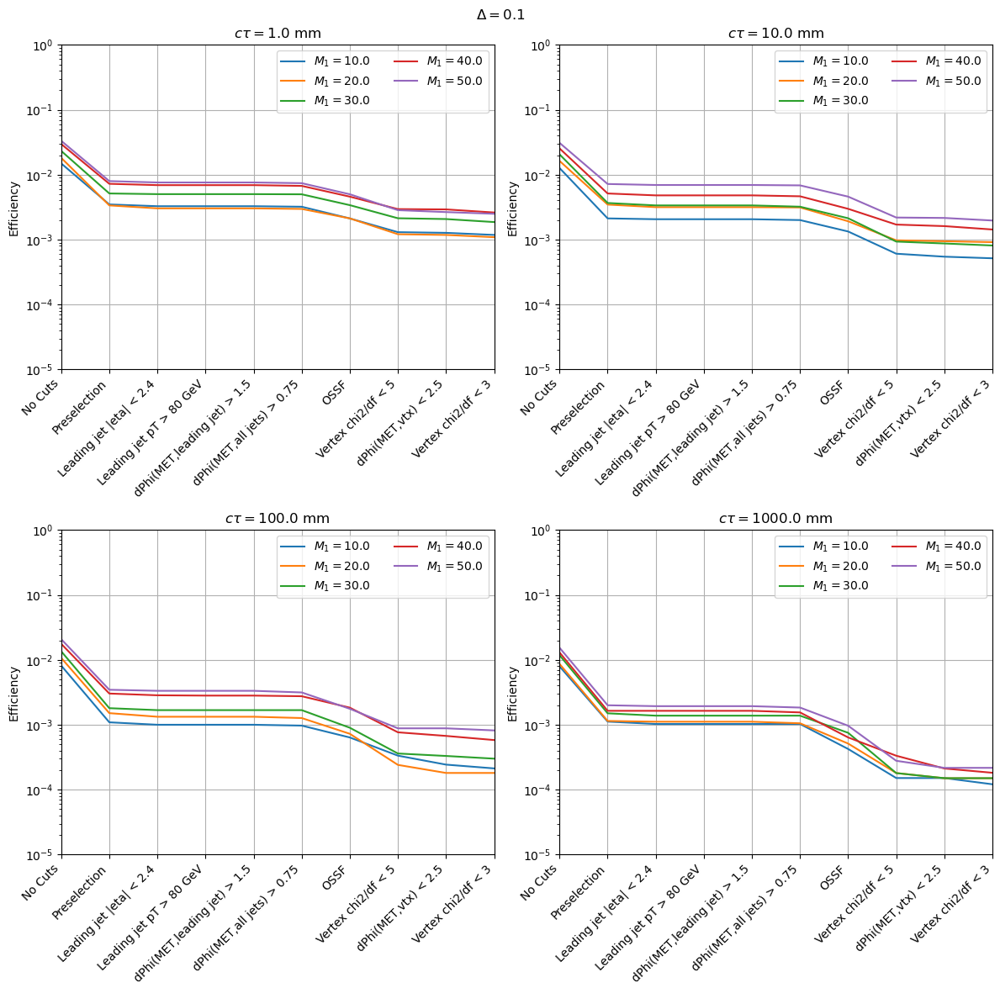

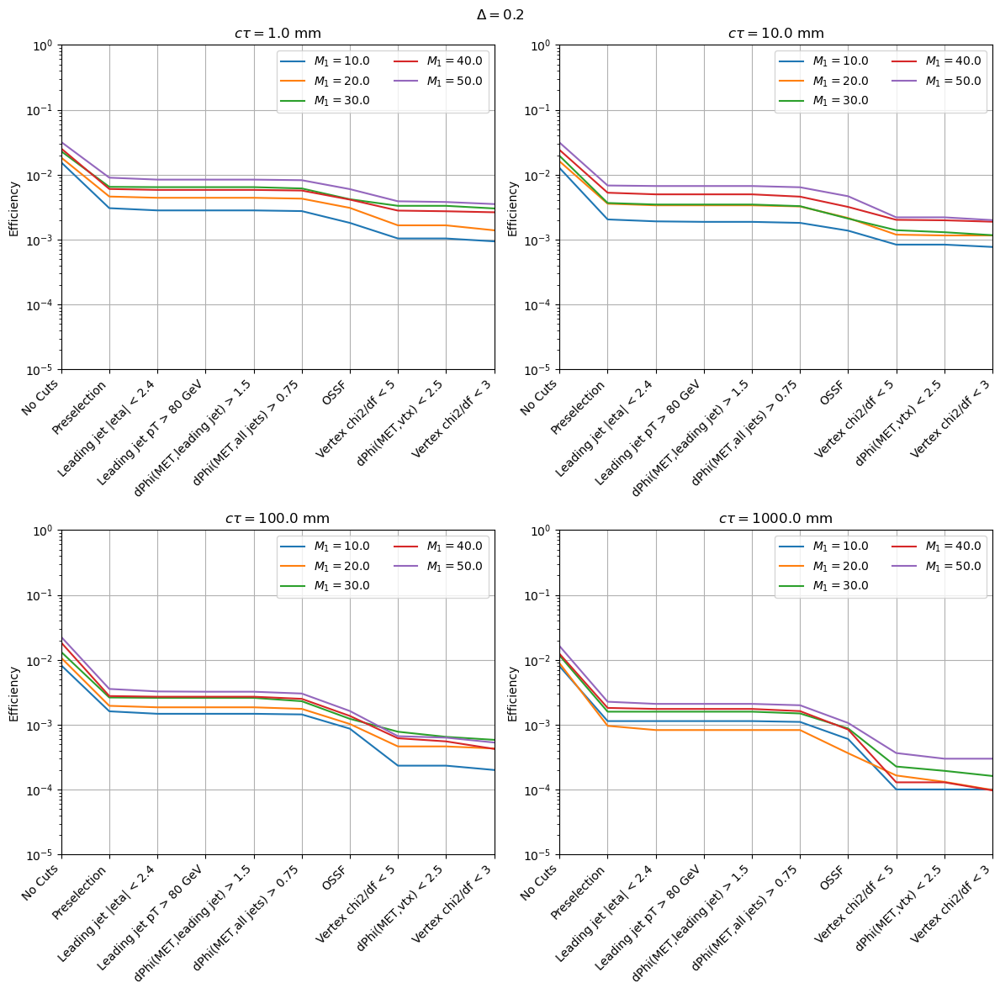

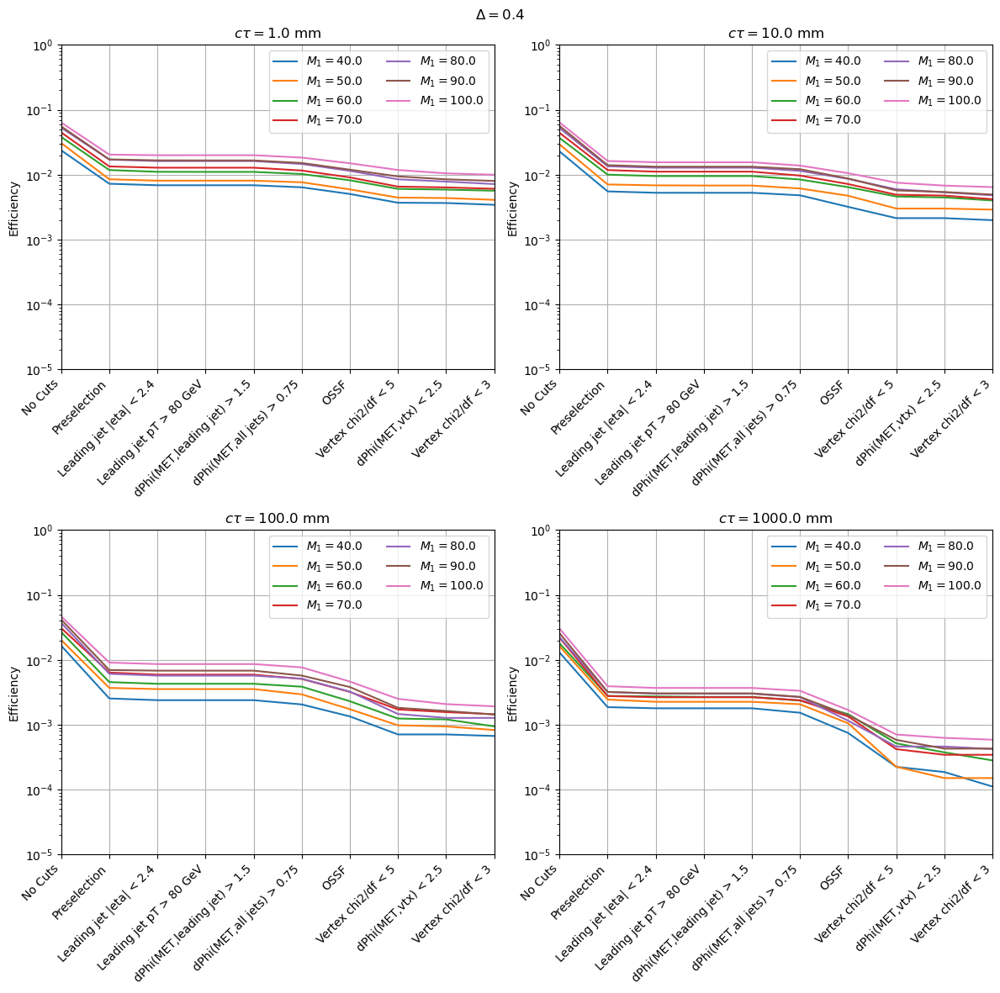

In [6]:
# signal efficiencies by delta/ctau
cf_s = sig['cutflow']
ct_s = sig['cutflow_cts']
desc = sig['cutDesc']
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [cf_s[pt][cut] for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1))
        plt.legend(loc='upper right',ncol=2)
        plt.ylim([0.00001,1])
        plt.xlim([0,len(cuts)-1])
        plt.yscale('log')
        plt.ylabel("Efficiency")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_effs_delta{delta:.1f}.pdf")
    #plt.close()

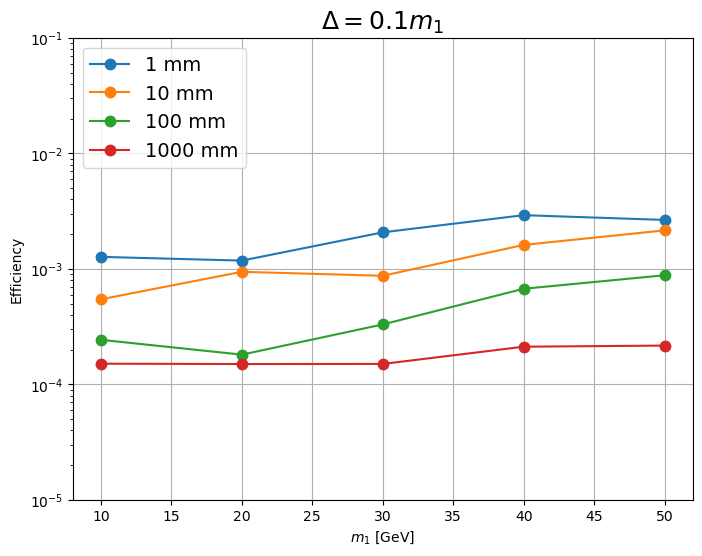

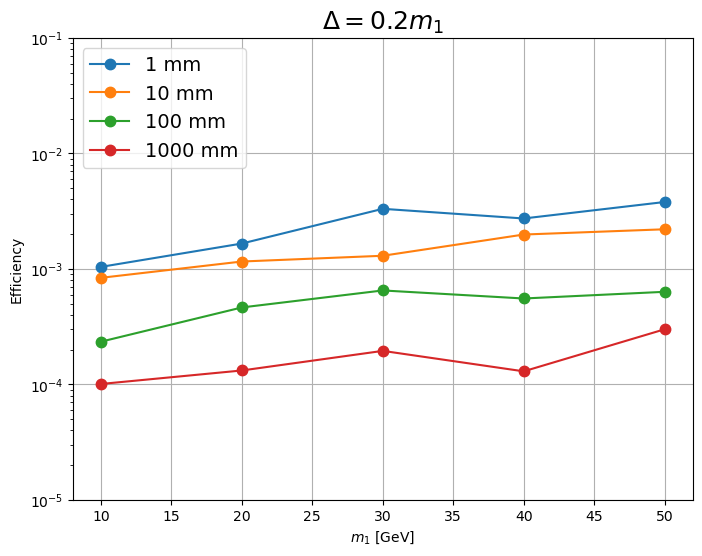

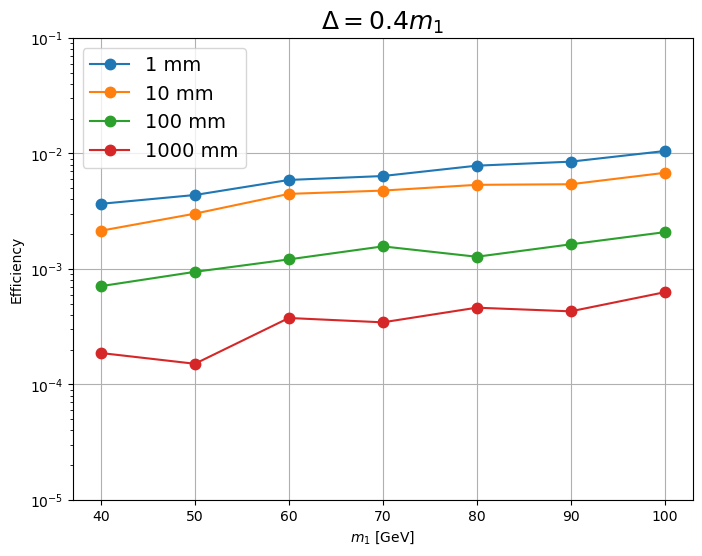

In [18]:
# signal efficiencies by m1 (ctau overlay) on last cut
cf_s = sig['cutflow']
ct_s = sig['cutflow_cts']
desc = sig['cutDesc']
for delta in deltas:
    plt.figure(figsize=(8,6))
    plt.title(f"$\Delta = {delta}m_1$",fontsize=18)
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        effs = []
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs.append(cf_s[pt]['cut6'])
        plt.plot(m1s,effs,label=f"{int(ct)} mm",marker='.',markersize=15)
    plt.legend(loc='upper left',fontsize=14)
    plt.ylim([0.00001,0.1])
    plt.yscale('log')
    plt.xlabel("$m_1$ [GeV]")
    plt.ylabel("Efficiency")
    plt.grid()
    plt.savefig(f"plots/cutflows/signal_lastCut_effs_delta{delta:.1f}.pdf")
    #plt.close()

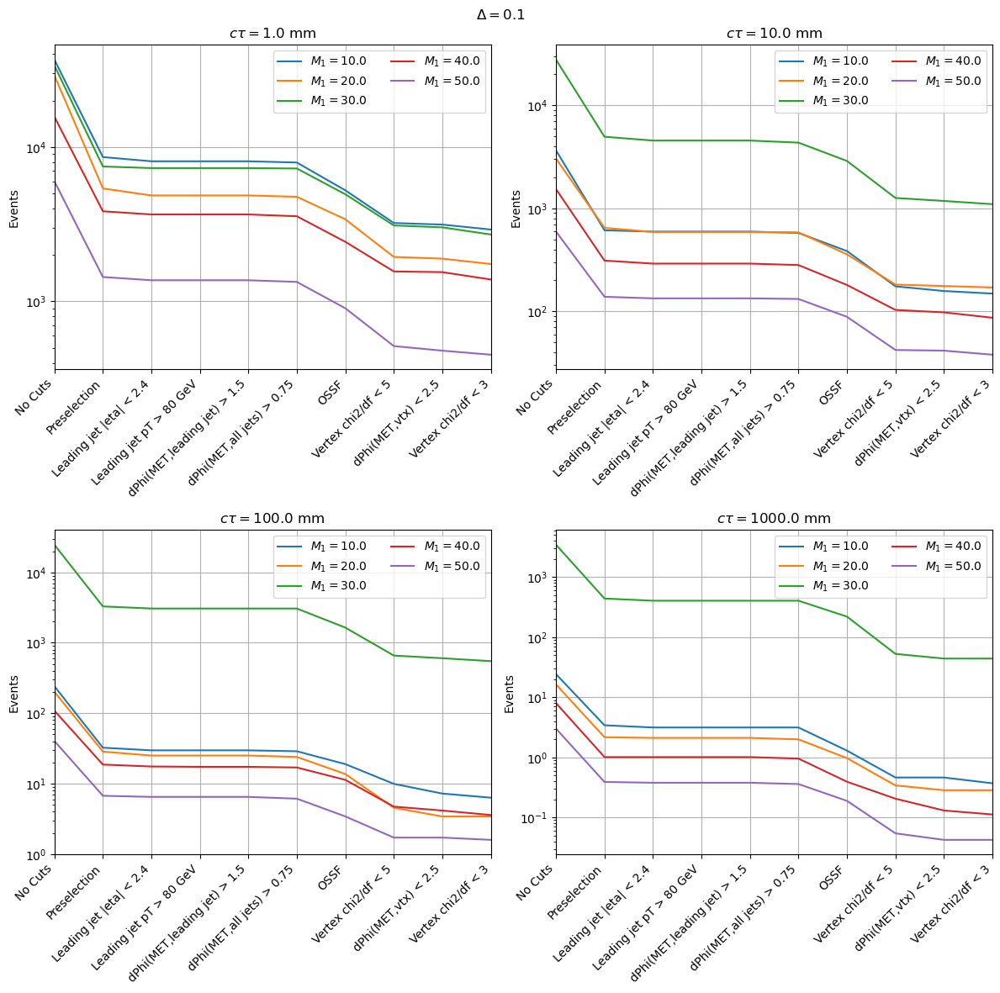

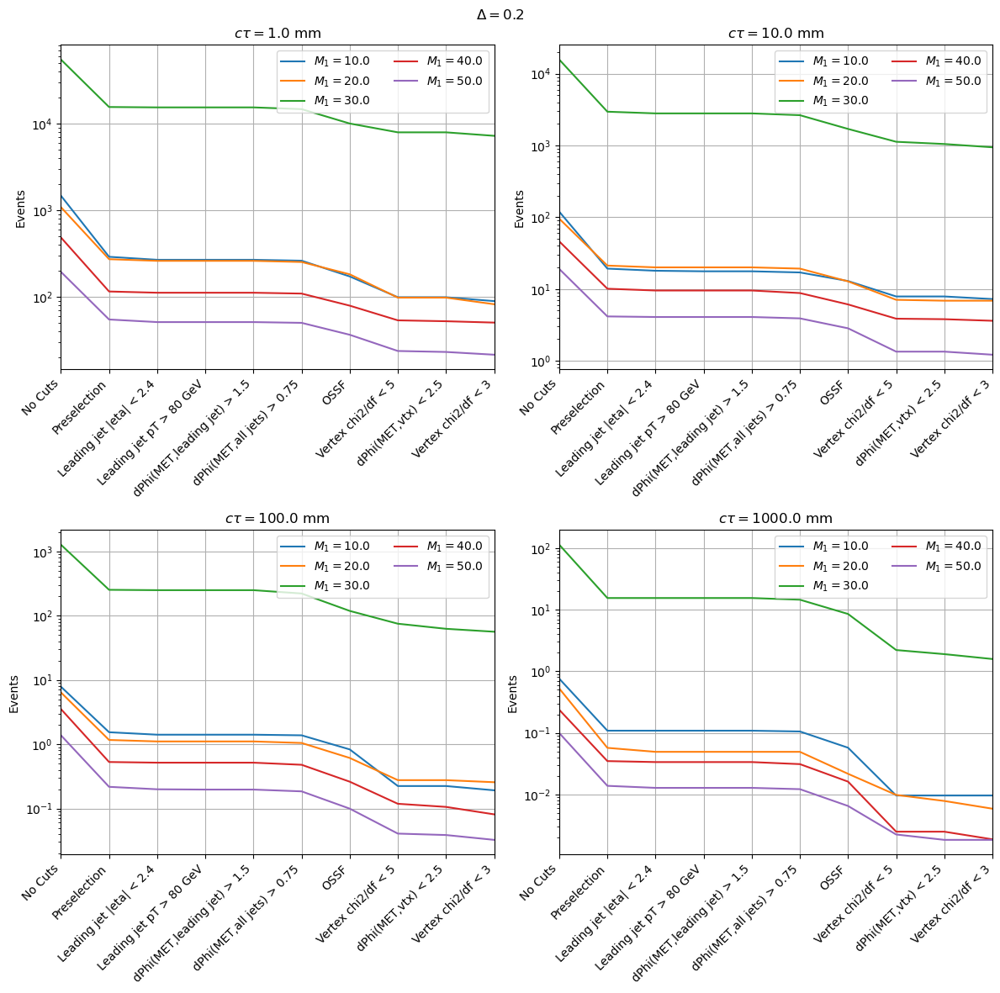

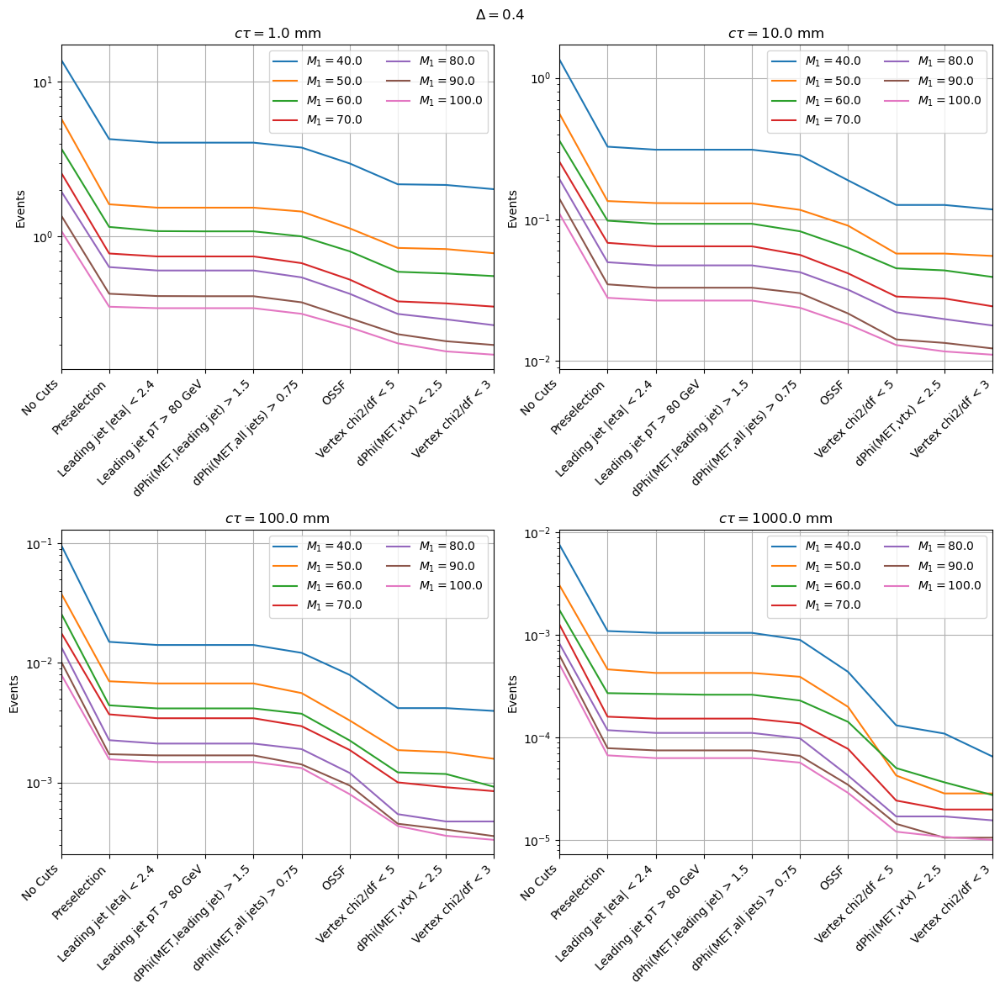

In [8]:
# signal counts by delta/ctau
cf_s = sig['cutflow']
ct_s = sig['cutflow_cts']
desc = sig['cutDesc']
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [ct_s[pt][cut] for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1))
        plt.legend(loc='upper right',ncol=2)
        #plt.ylim([0.00001,100000])
        plt.xlim([0,len(cuts)-1])
        plt.yscale('log')
        plt.ylabel("Events")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_counts_delta{delta:.1f}.pdf")
    #plt.close()

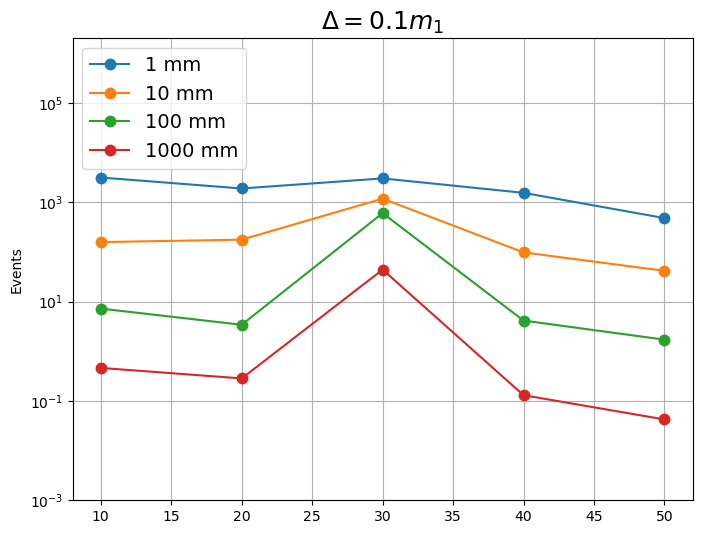

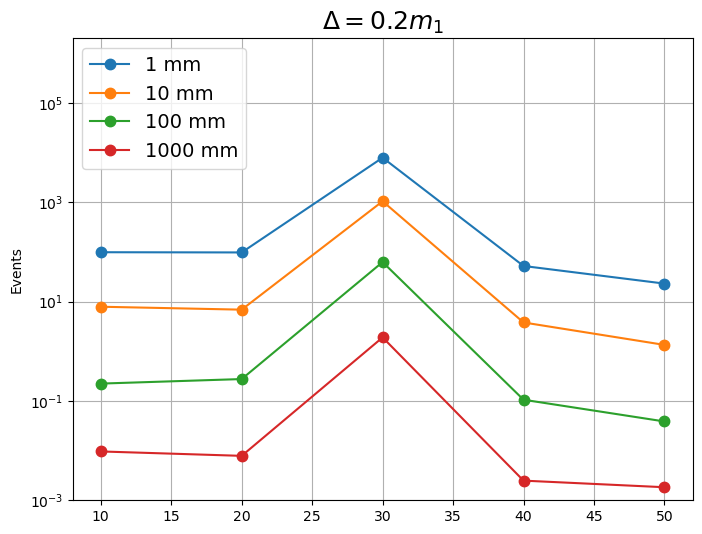

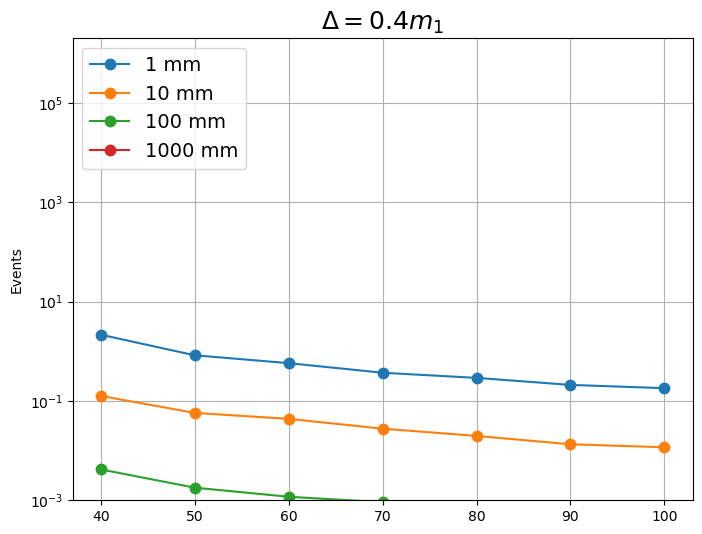

In [9]:
# signal counts by m1 (ctau overlay) on last cut
cf_s = sig['cutflow']
ct_s = sig['cutflow_cts']
desc = sig['cutDesc']
for delta in deltas:
    plt.figure(figsize=(8,6))
    plt.title(f"$\Delta = {delta}m_1$",fontsize=18)
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        effs = []
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs.append(ct_s[pt]['cut6'])
        plt.plot(m1s,effs,label=f"{int(ct)} mm",marker='.',markersize=15)
    plt.legend(loc='upper left',fontsize=14)
    plt.ylim([0.001,2e6])
    plt.yscale('log')
    plt.ylabel("Events")
    plt.grid()
    plt.savefig(f"plots/cutflows/signal_lastCut_counts_delta{delta:.1f}.pdf")
    #plt.close()

# Bkg

In [10]:
tot_bkg_cts = {}
tot_bkg_effs = {}
total_bkg_counts = {b:sum([bkg['cutflow_cts'][b][k]['all']/bkg['cutflow'][b][k]['all'] for k in bkg['cutflow'][b].keys()]) for b in bkg['cutflow_cts'].keys()}
for b in bkg['cutflow_cts'].keys():
    cfd = bkg['cutflow_cts'][b]
    effd = bkg['cutflow'][b]
    cts_dict = {k:0 for k in cuts}
    for k in cfd.keys():
        for c in cuts:
            cts_dict[c] += cfd[k][c]
    tot_bkg_cts[b] = cts_dict
    tot_bkg_effs[b] = {c:cts_dict[c]/total_bkg_counts[b] for c in cuts}
bkg_summed_cts = {c:sum([tot_bkg_cts[b][c] for b in tot_bkg_cts.keys()]) for c in cuts}

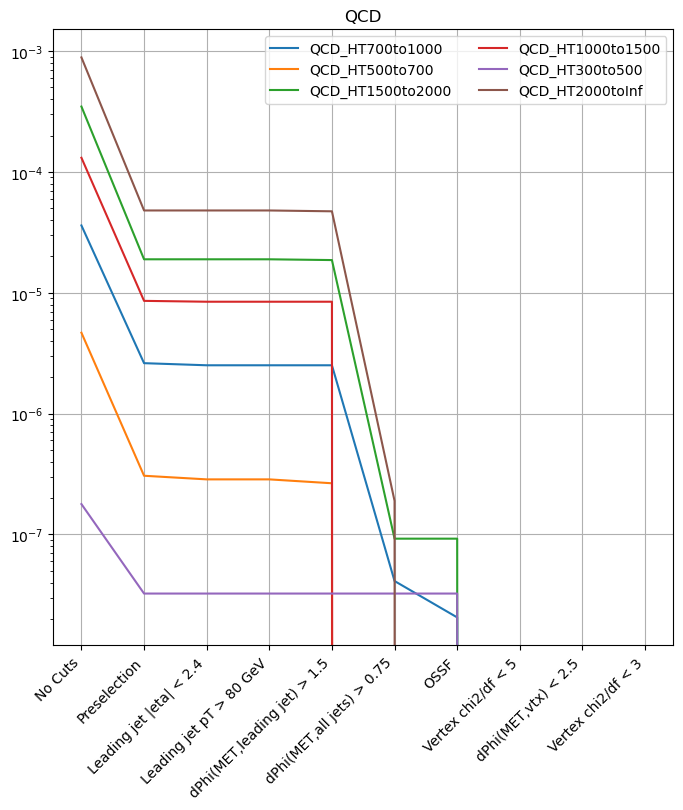

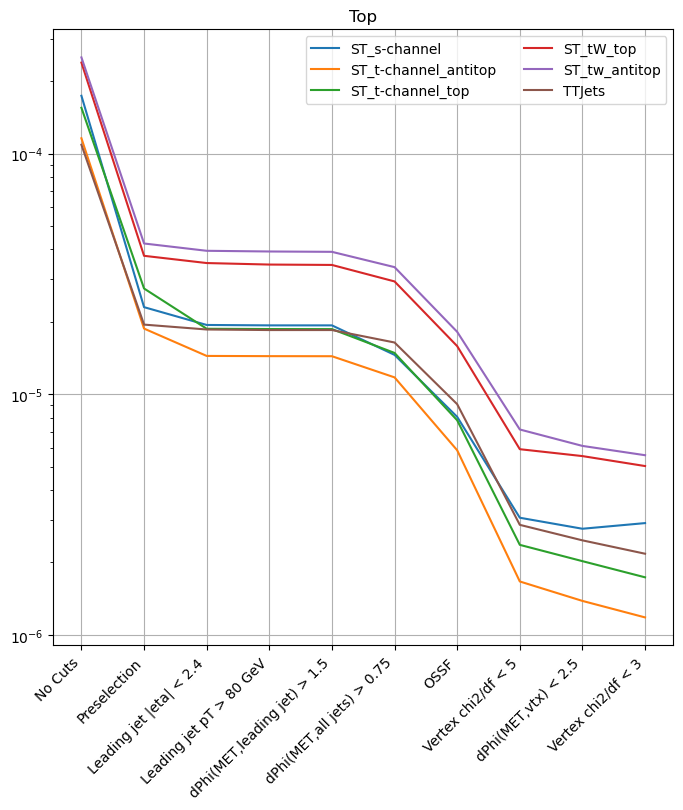

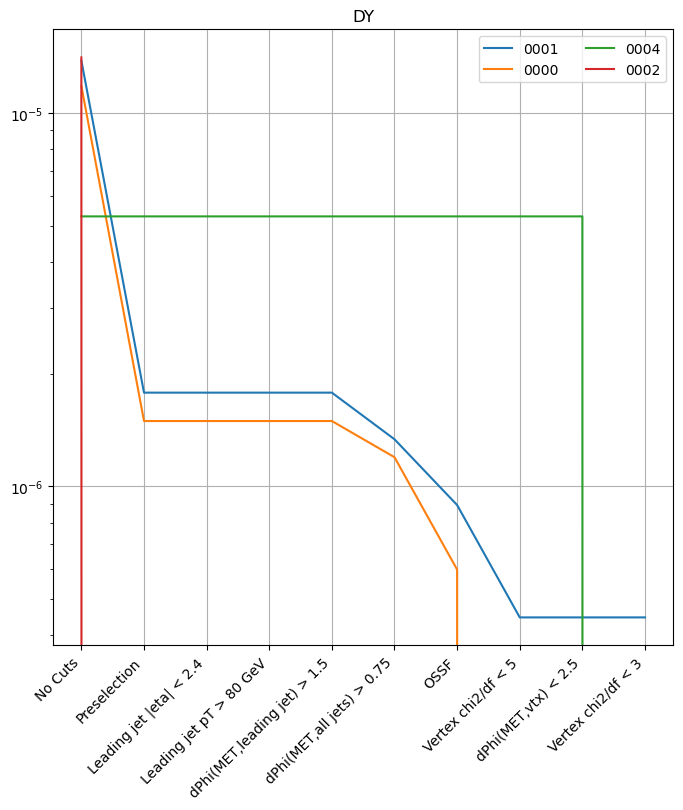

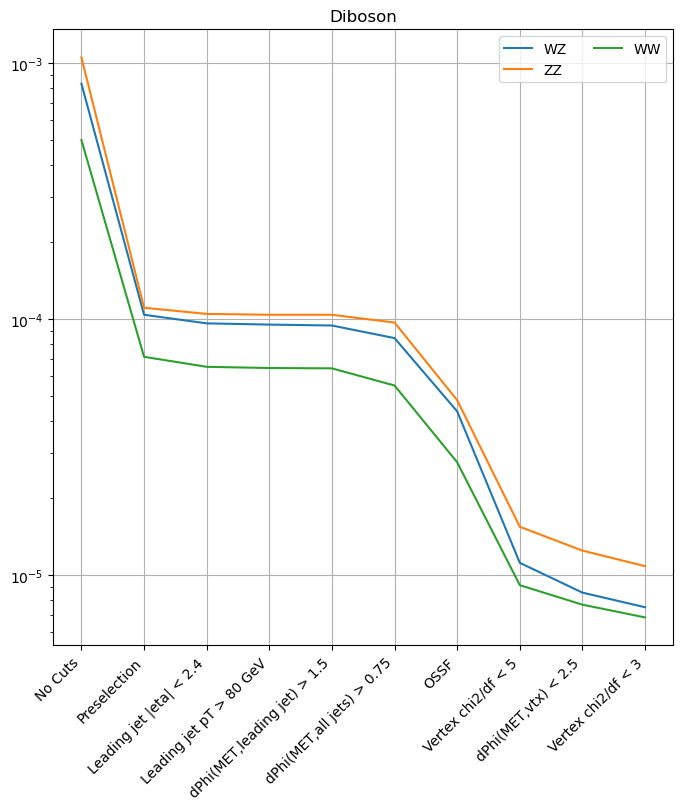

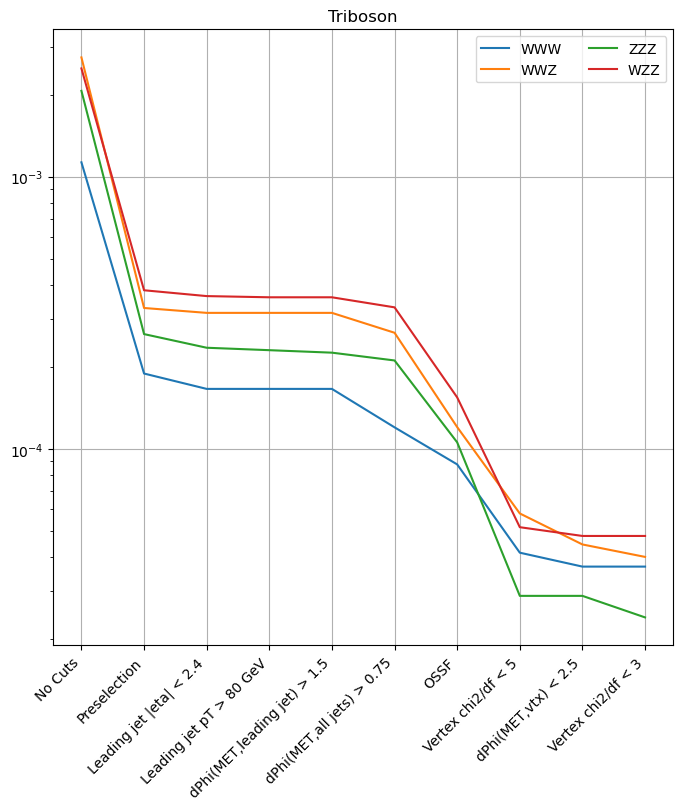

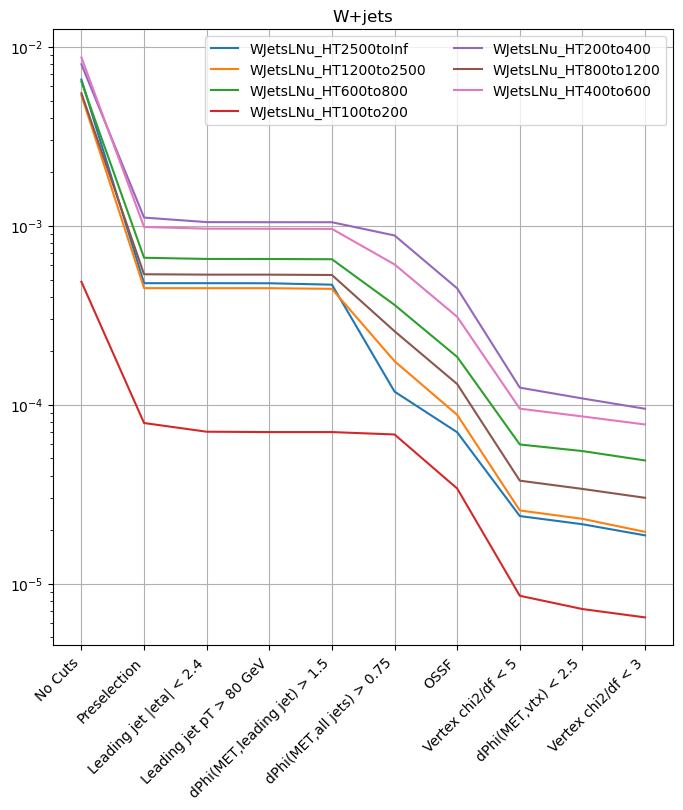

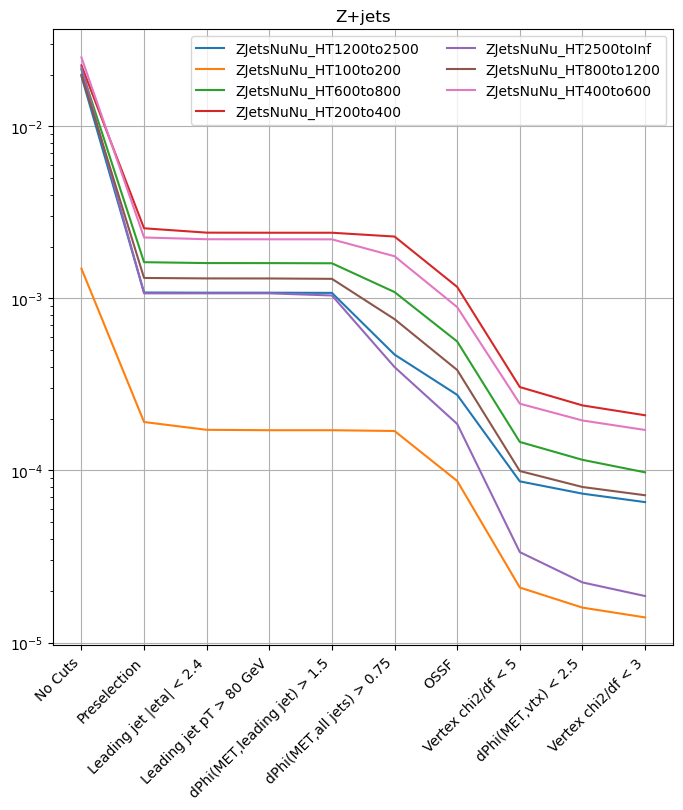

In [11]:
# bkg efficiencies in sub-samples (e.g. HT bins)
for b in bkg['cutflow'].keys():
    cfbs = bkg['cutflow'][b]
    plt.figure(figsize=(8,8))
    plt.title(b)
    subsamples = list(cfbs.keys())
    for bkg_pt in subsamples:
        cf = cfbs[bkg_pt]
        effs = [cf[c] for c in cuts]
        plt.plot(np.arange(len(effs)),effs,label=bkg_pt[9:])
    #plt.ylim([1e-12,1])
    plt.yscale('log')
    plt.legend(loc='upper right',ncol=2)
    plt.grid()
    #plt.xlabel("Cut Number")
    plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
    plt.savefig(f"plots/cutflows/bkg_{b}_cutflow.pdf")
    #plt.close()

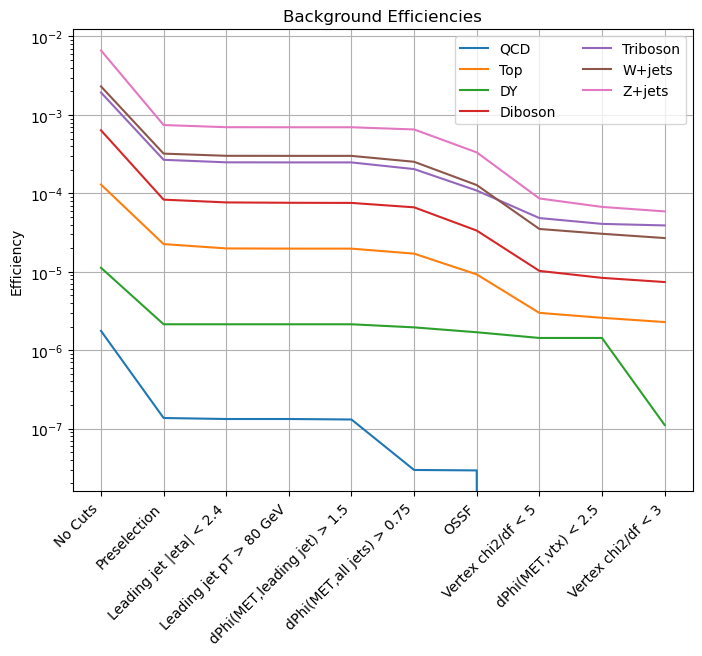

In [12]:
# bkg efficiencies summed over sub-samples
plt.figure(figsize=(8,6))
plt.title("Background Efficiencies")
for b in bkg['cutflow'].keys():
    cfbs = tot_bkg_effs[b]
    effs = [cfbs[c] for c in cuts]
    plt.plot(np.arange(len(effs)),effs,label=b)
    #plt.ylim([1e-12,1])
plt.yscale('log')
plt.ylabel("Efficiency")
plt.legend(loc='upper right',ncol=2)
plt.grid()
plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
plt.savefig(f"plots/cutflows/bkg_combined_cutflow.pdf")

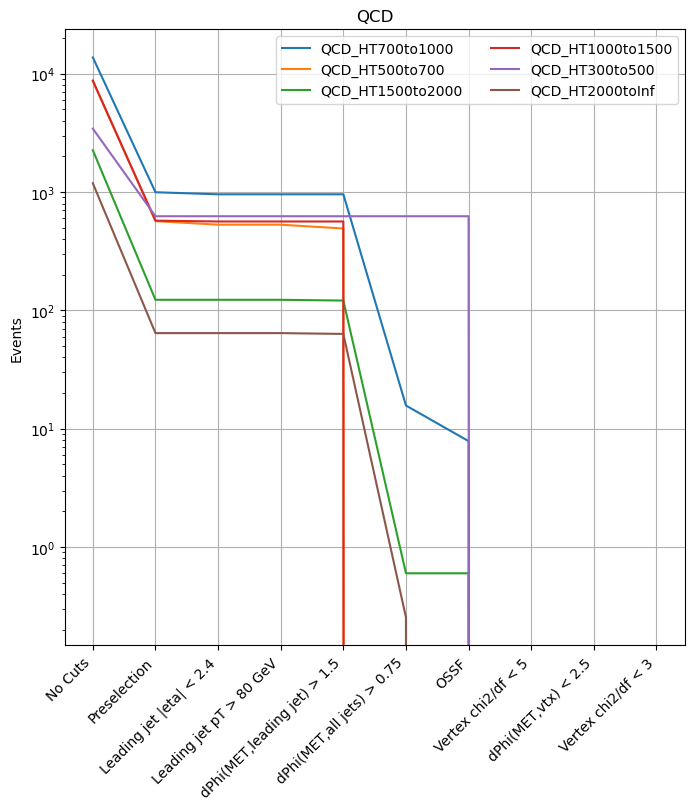

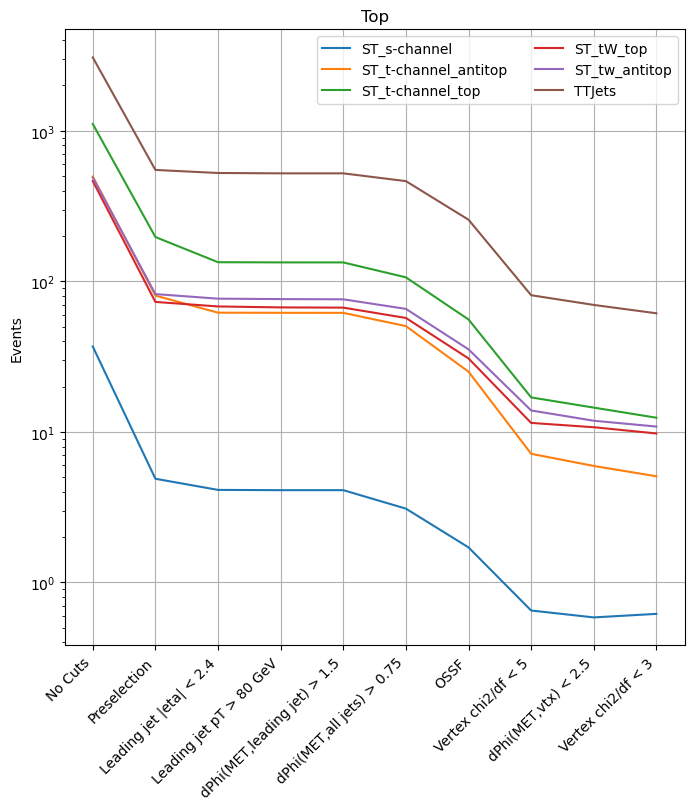

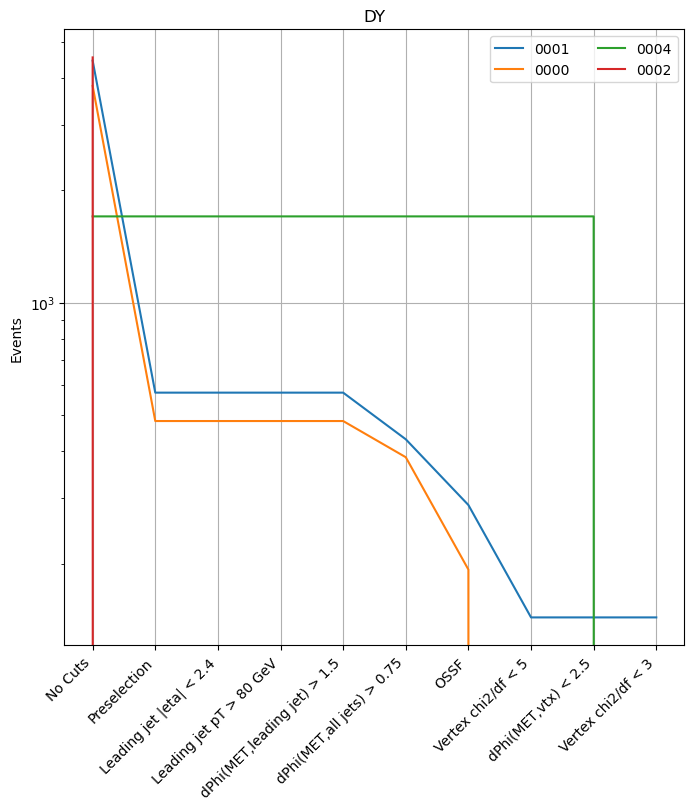

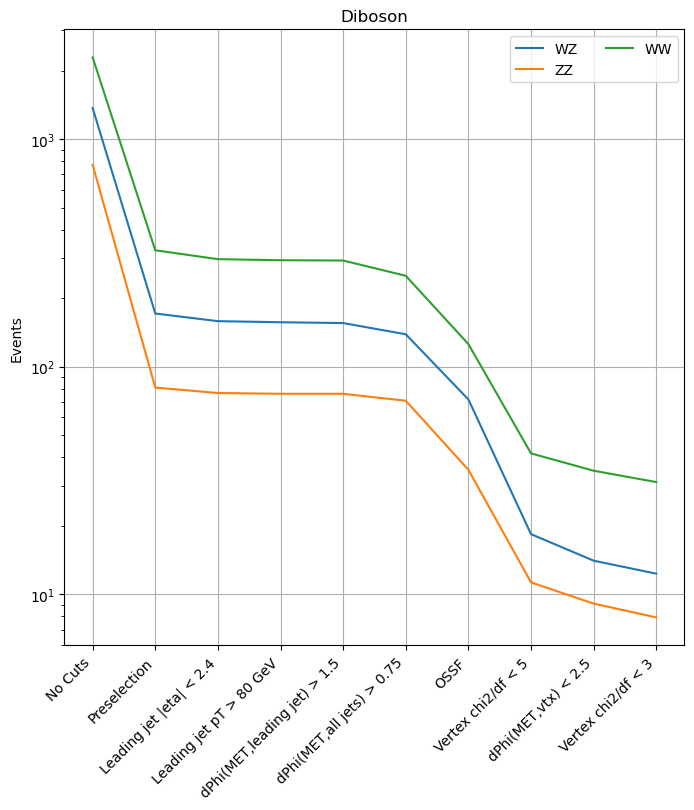

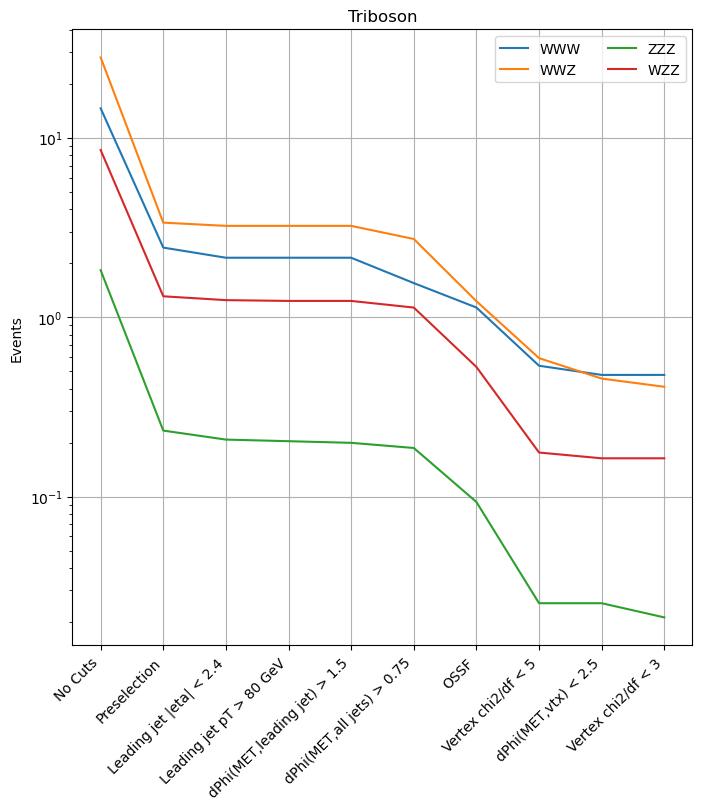

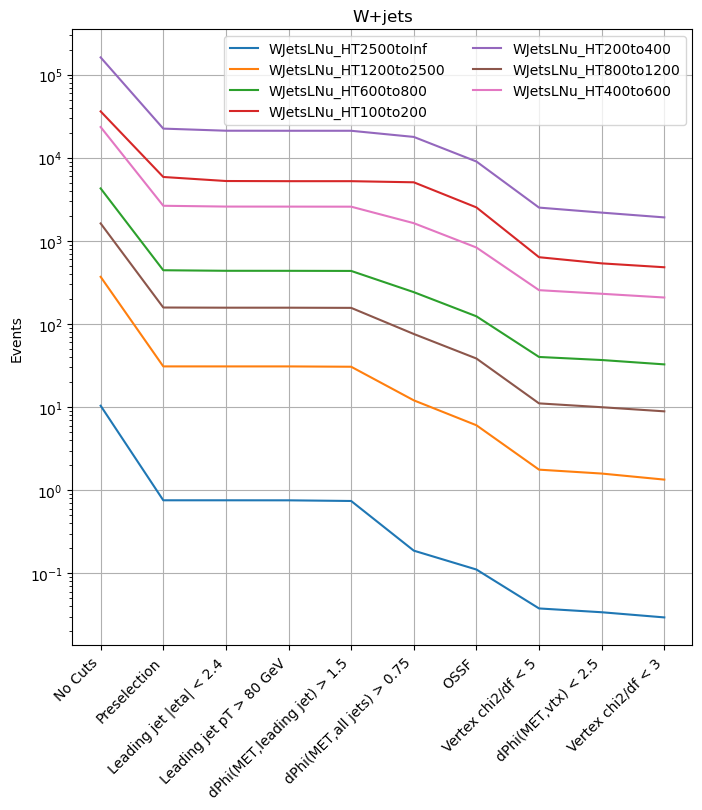

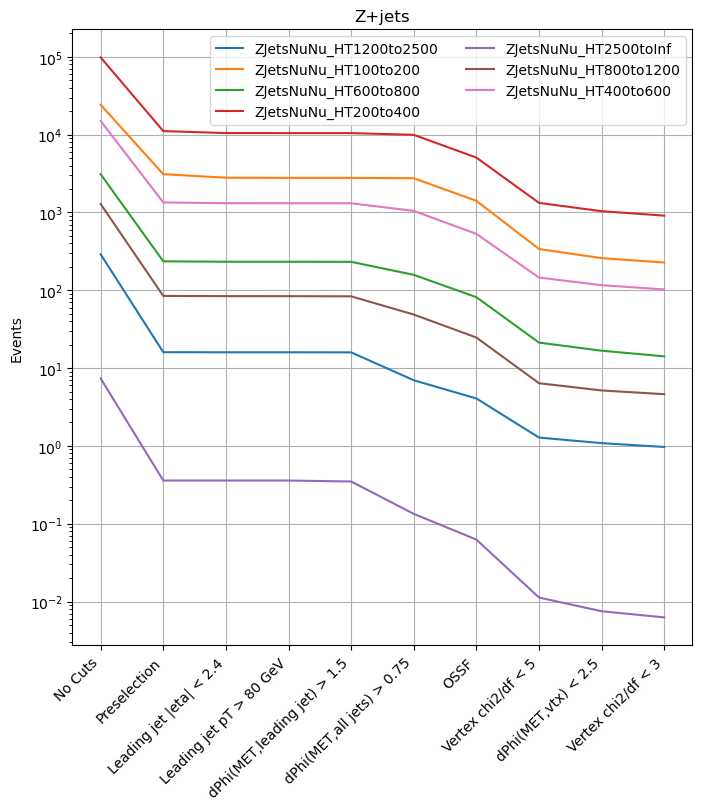

In [13]:
# bkg counts
for b in bkg['cutflow'].keys():
    cfbs = bkg['cutflow_cts'][b]
    plt.figure(figsize=(8,8))
    plt.title(b)
    subsamples = list(cfbs.keys())
    for bkg_pt in subsamples:
        cf = cfbs[bkg_pt]
        effs = [cf[c] for c in cuts]
        plt.plot(np.arange(len(effs)),effs,label=bkg_pt[9:])
    #plt.ylim([1e-12,1])
    plt.yscale('log')
    plt.ylabel('Events')
    plt.legend(loc='upper right',ncol=2)
    plt.grid()
    #plt.xlabel("Cut Number")
    plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
    plt.savefig(f"plots/cutflows/bkg_{b}_counts_pdf")
    #plt.close()

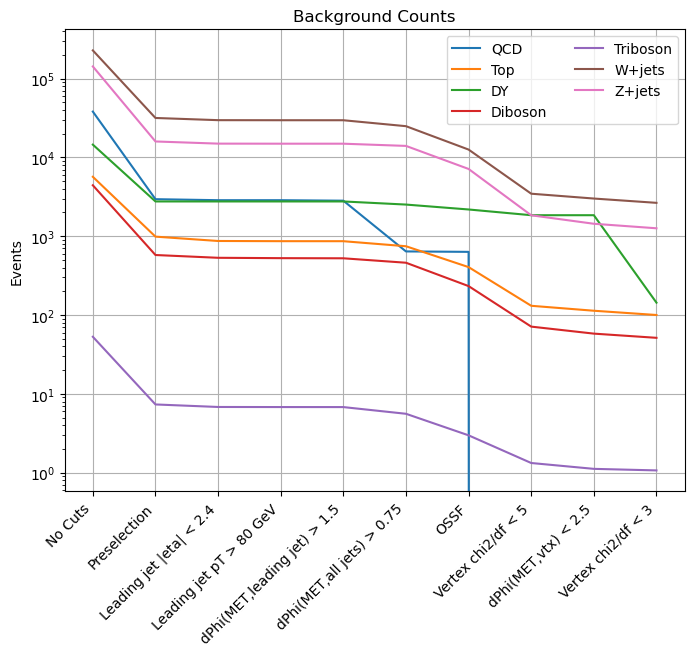

In [14]:
# bkg counts summed over sub-samples
plt.figure(figsize=(8,6))
plt.title("Background Counts")
for b in bkg['cutflow'].keys():
    cfbs = tot_bkg_cts[b]
    cts = [cfbs[c] for c in cuts]
    plt.plot(np.arange(len(cts)),cts,label=b)
    #plt.ylim([1e-12,1])
plt.yscale('log')
plt.ylabel('Events')
plt.legend(loc='upper right',ncol=2)
plt.grid()
plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
plt.savefig(f"plots/cutflows/bkg_combined_counts.pdf")

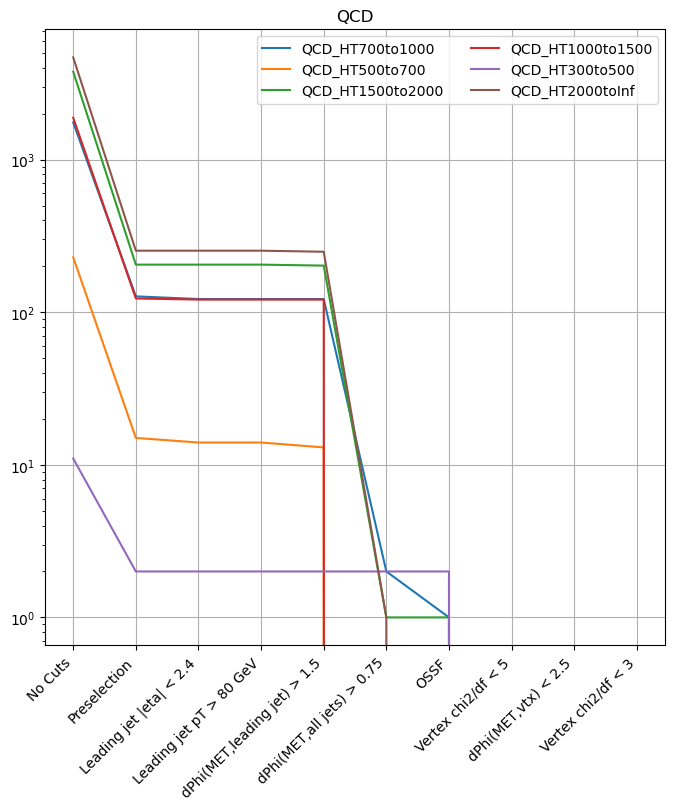

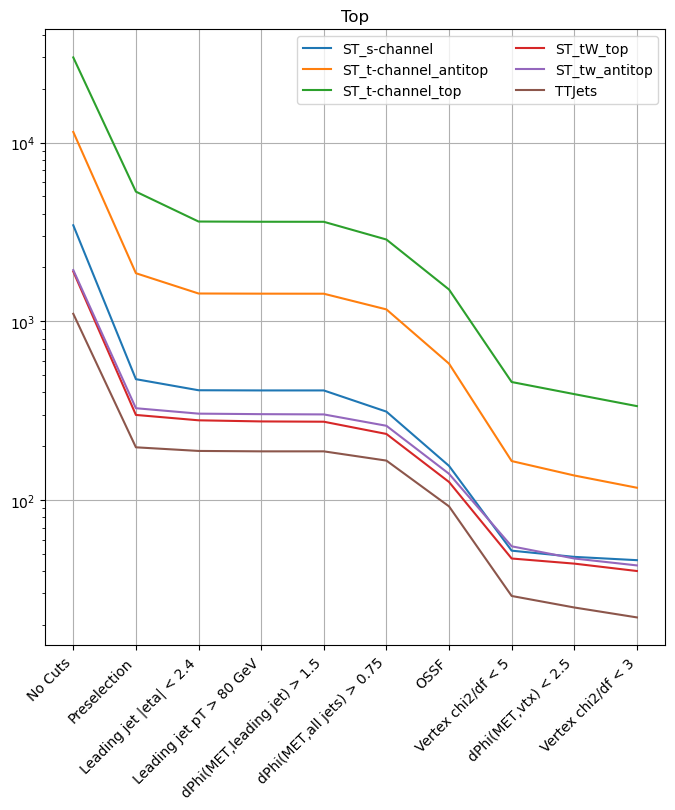

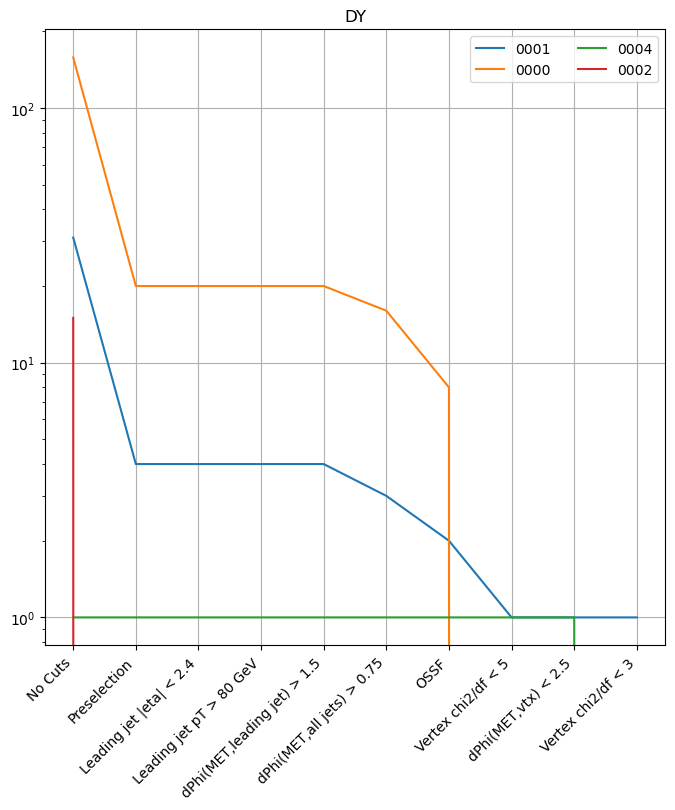

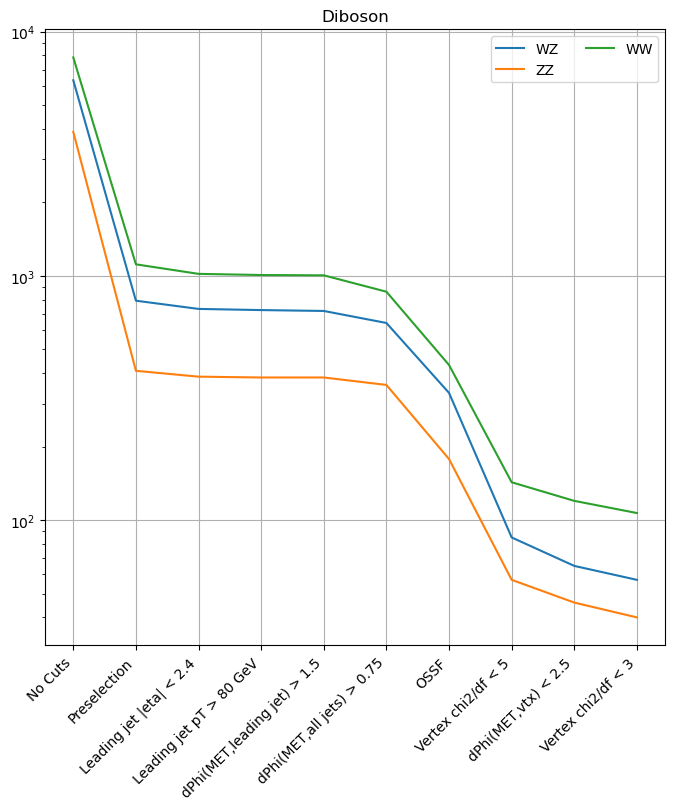

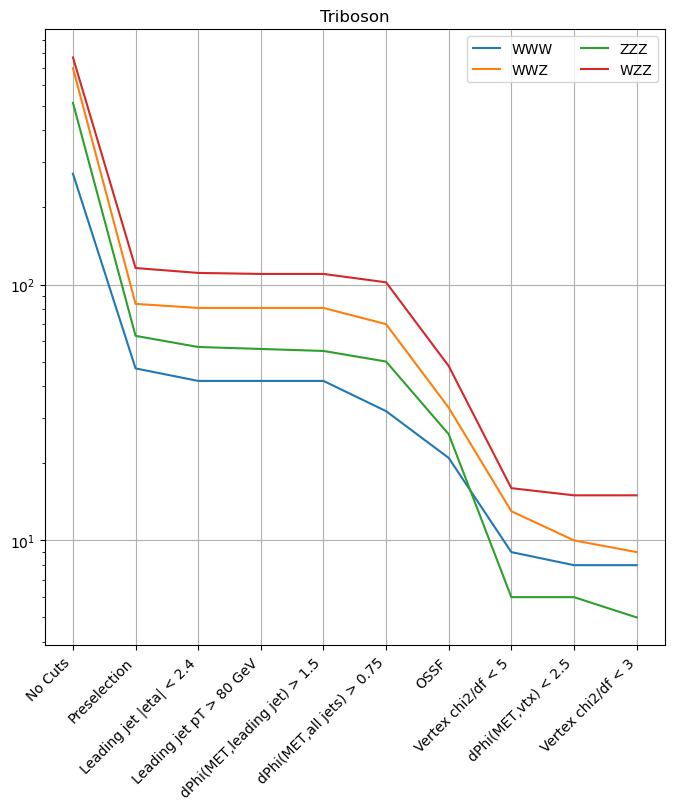

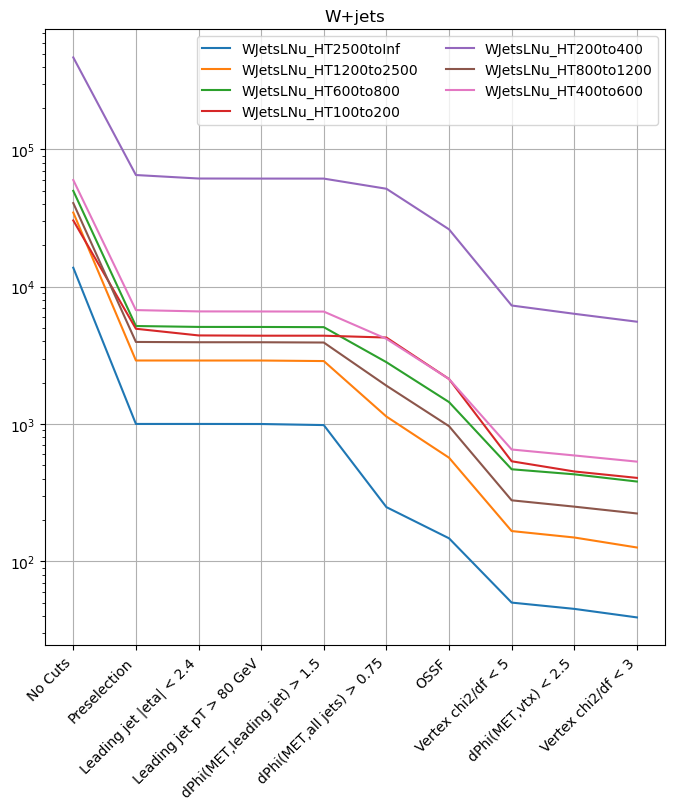

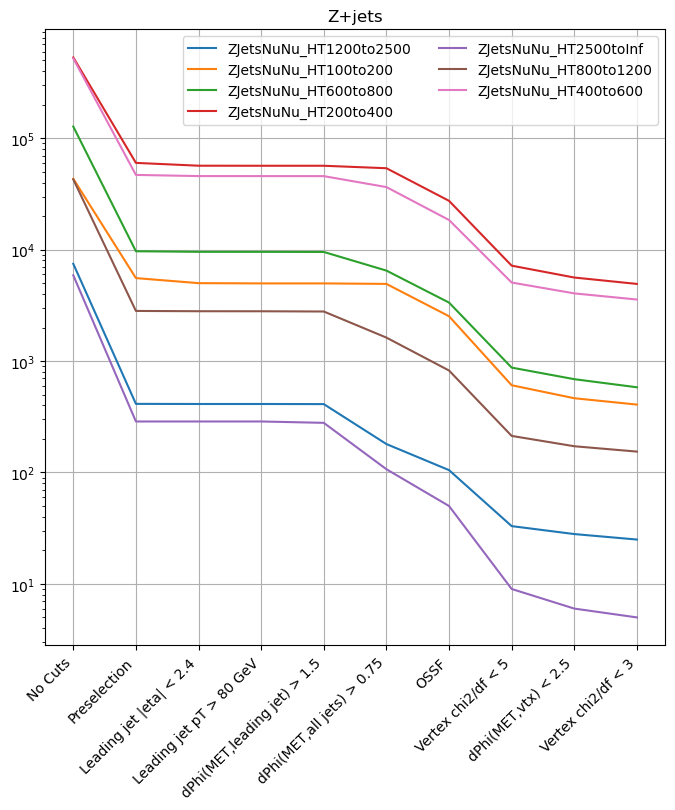

In [15]:
# bkg nevts
for b in bkg['cutflow'].keys():
    cfbs = bkg['cutflow_nevts'][b]
    plt.figure(figsize=(8,8))
    plt.title(b)
    subsamples = list(cfbs.keys())
    for bkg_pt in subsamples:
        cf = cfbs[bkg_pt]
        effs = [cf[c] for c in cuts]
        plt.plot(np.arange(len(effs)),effs,label=bkg_pt[9:])
    #plt.ylim([1e-12,1])
    plt.yscale('log')
    plt.legend(loc='upper right',ncol=2)
    plt.grid()
    #plt.xlabel("Cut Number")
    plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
    plt.savefig(f"plots/cutflows/bkg_{b}_counts_pdf")
    #plt.close()

# signal vs bkg

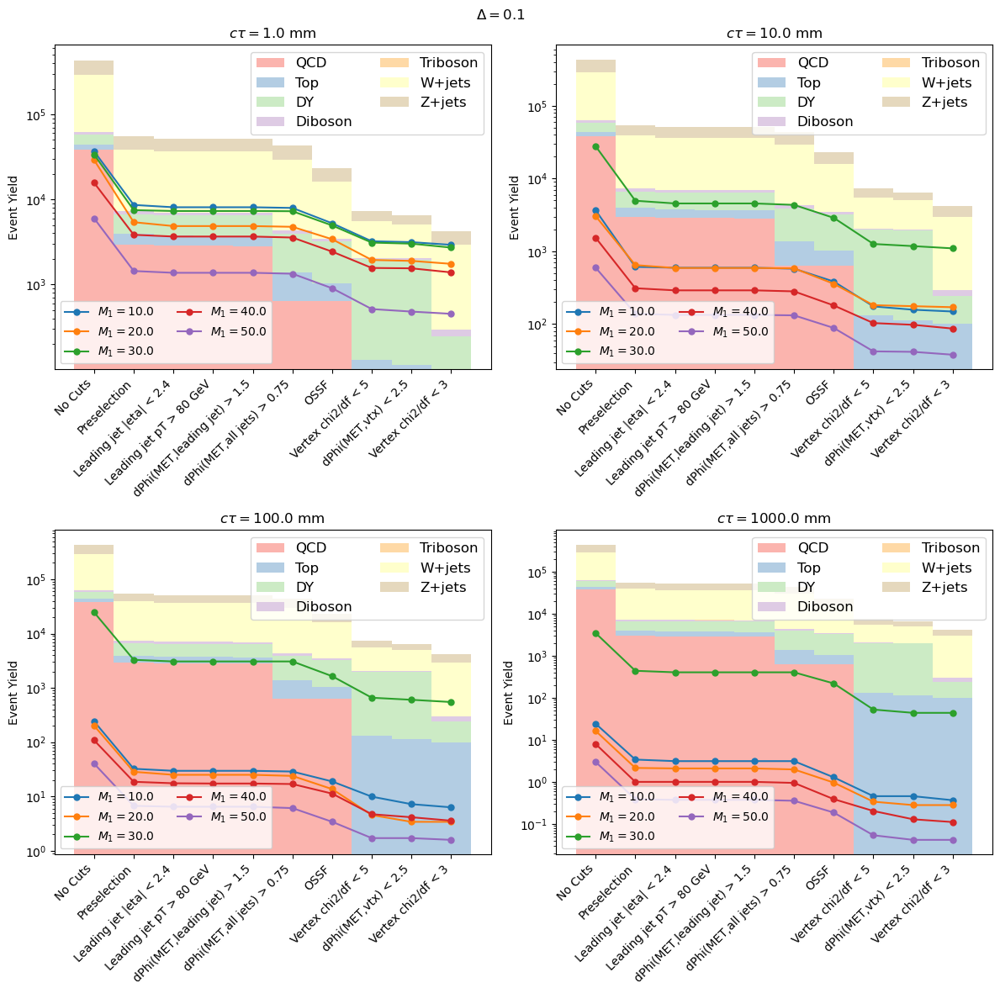

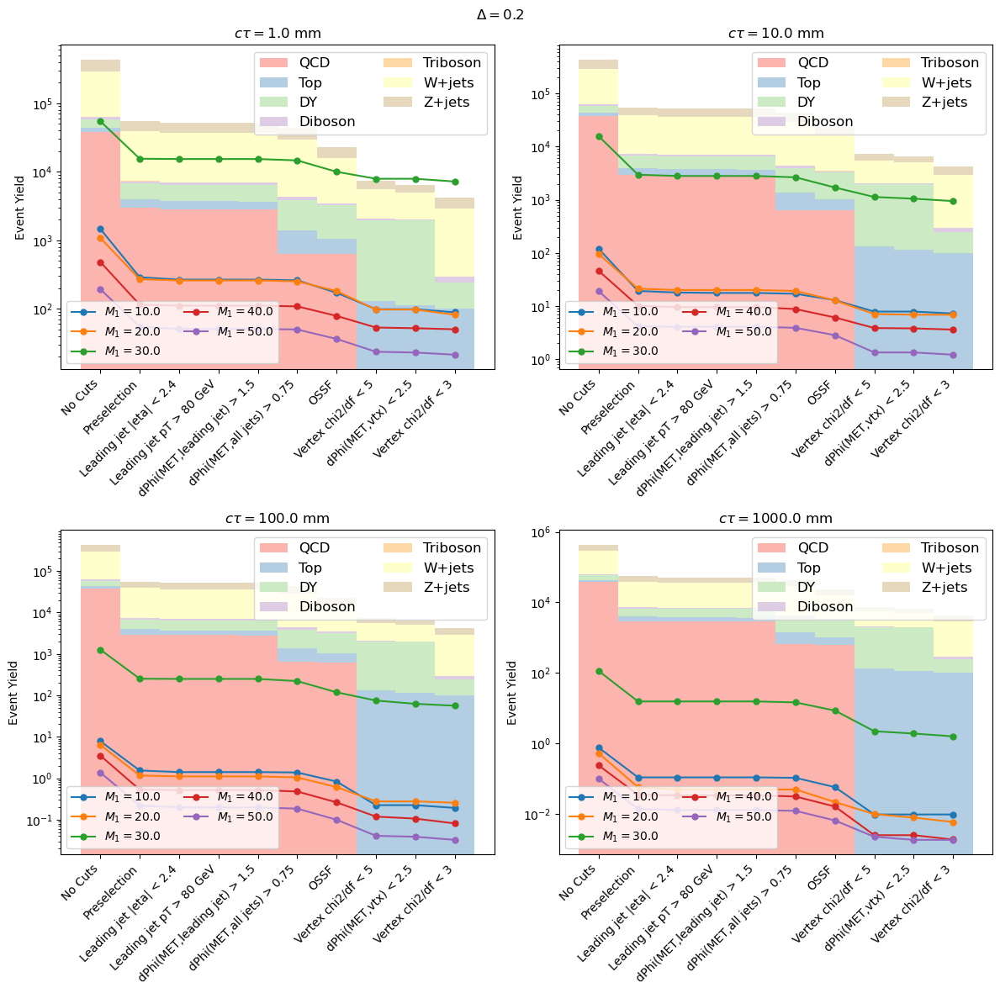

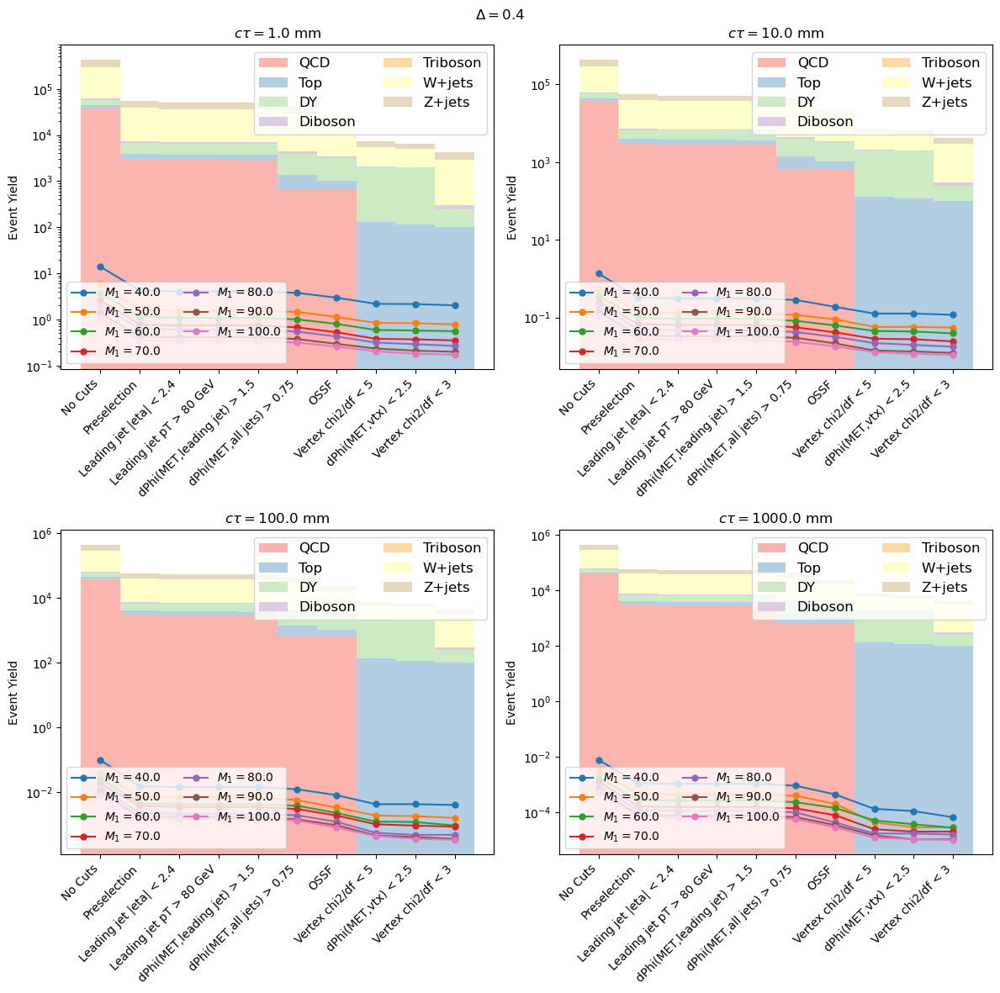

In [16]:
backgrounds = list(tot_bkg_cts.keys())

for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        bkg_labels = []
        bkg_heights = []
        bottoms = np.array([0.0 for c in cuts])
        cmap = plt.get_cmap('Pastel1')
        bars = []
        for j,b in enumerate(backgrounds):
            heights = [tot_bkg_cts[b][c] for c in cuts]
            x = np.arange(len(cuts))
            bars.append(plt.bar(x,heights,width=1,align='center',bottom=bottoms,color=cmap(j)))
            bottoms += np.array(heights)
        leg1 = plt.legend(bars,backgrounds,loc='upper right',fontsize=12,ncol=2)
        ax = plt.gca().add_artist(leg1)
        
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        lines = []
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [sig['cutflow_cts'][pt][cut] for cut in cuts]
            l, = plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1),marker='.',markersize=10)
            lines.append(l)
        plt.legend(handles=lines,loc='lower left',ncol=2)
        #plt.ylim([1e-2,1e6])
        #plt.xlim([3,11])
        plt.yscale('log')
        plt.ylabel("Event Yield")
        #plt.xlabel("Cut Number")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        #plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_vs_itemizedBkg_counts_delta{delta:.1f}.pdf")
    #plt.close()

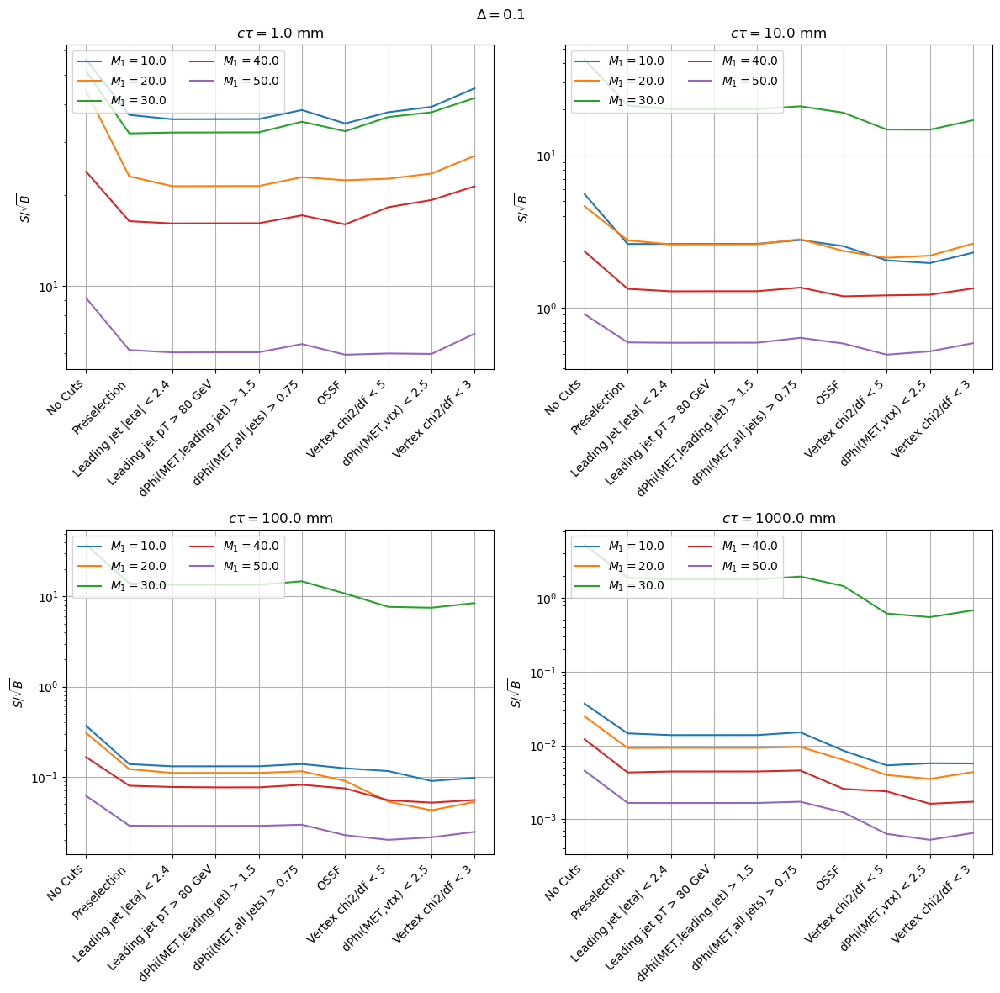

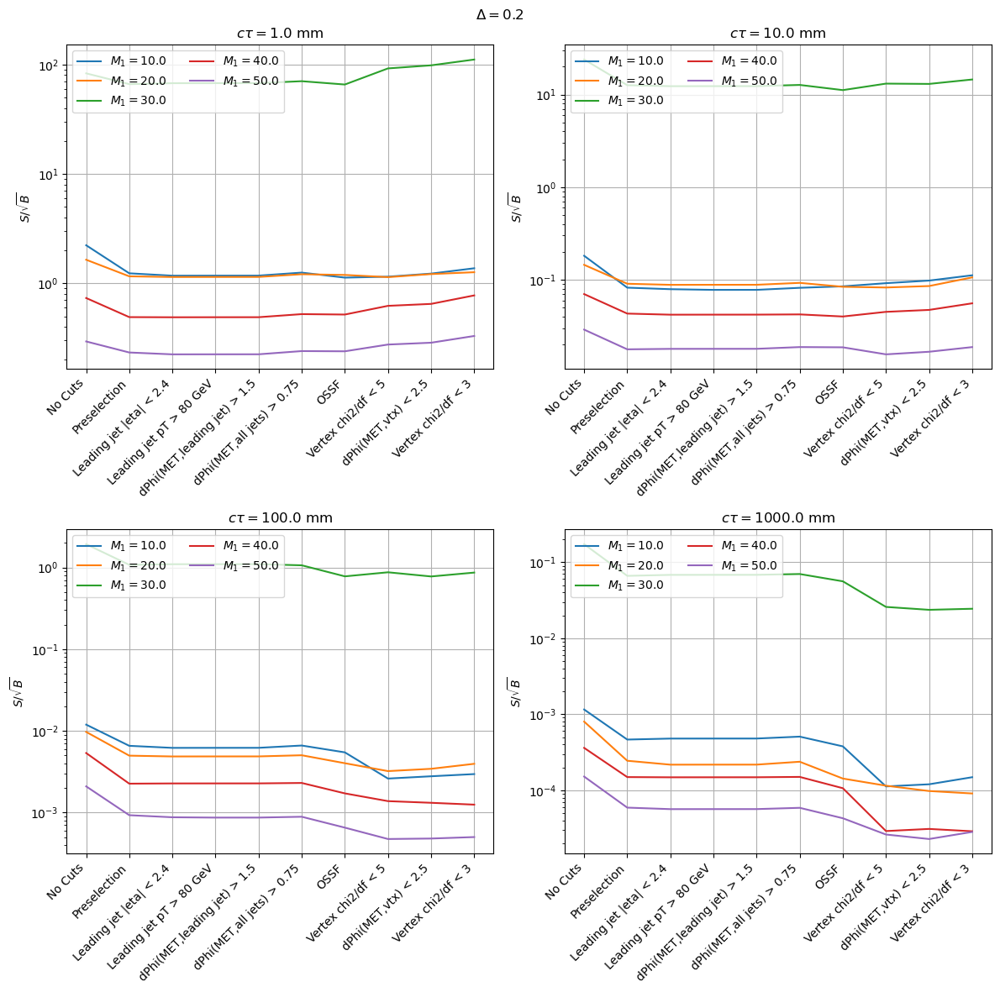

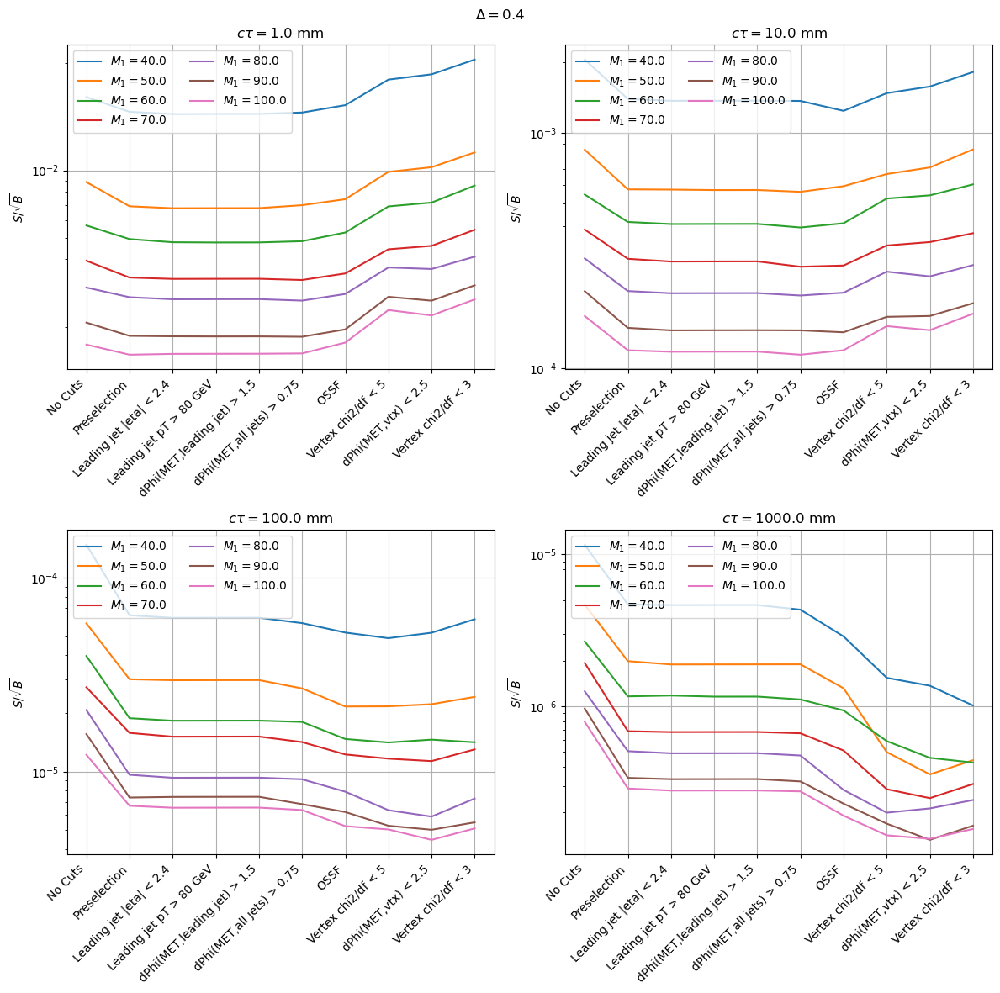

In [17]:
# S/sqrt(B)
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [ct_s[pt][cut]/np.sqrt(bkg_summed_cts[cut]) for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1))
        plt.legend(loc='upper left',ncol=2)
        #plt.ylim([1e-5,1e2])
        #plt.xlim([3,11])
        plt.yscale('log')
        plt.ylabel(r"$S/\sqrt{B}$")
        #plt.xlabel("Cut Number")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_signif_delta{delta:.1f}.pdf")
    #plt.close()

In [19]:
f_sig = "signal_2018_aEM.coffea"
sig = util.load(f_sig)[0]

bkg_files = {
    "QCD":"bkg_2018_QCD_TuneCP5_PSWeights.coffea",
    "Top":"bkg_2018_Top.coffea",
    "DY":"bkg_2018_DY.coffea",
    "Diboson":"bkg_2018_Diboson.coffea",
    "Triboson":"bkg_2018_Triboson.coffea",
    "W+jets":"bkg_2018_WJets.coffea",
    "Z+jets":"bkg_2018_ZJets.coffea"
}
bkg_histos = {}
histograms = []
for b in bkg_files.keys():
    bkg_histos[b] = util.load(bkg_files[b])[0]
    histograms = list(bkg_histos[b].keys())
bkg = {}
for h in histograms:
    if type(bkg_histos['QCD'][h]) != hist.Hist:
        bkg[h] = {b:bkg_histos[b][h] for b in bkg_histos.keys()}

In [20]:
f_sig = "signal_2018_aEM_ejdR_rejection.coffea"
sig_rej = util.load(f_sig)[0]

bkg_files = {
    "QCD":"bkg_2018_QCD_TuneCP5_PSWeights_ejdR_rejection.coffea",
    "Top":"bkg_2018_Top_ejdR_rejection.coffea",
    "DY":"bkg_2018_DY_ejdR_rejection.coffea",
    "Diboson":"bkg_2018_Diboson_ejdR_rejection.coffea",
    "Triboson":"bkg_2018_Triboson_ejdR_rejection.coffea",
    "W+jets":"bkg_2018_WJets_ejdR_rejection.coffea",
    "Z+jets":"bkg_2018_ZJets_ejdR_rejection.coffea"
}
bkg_histos = {}
histograms = []
for b in bkg_files.keys():
    bkg_histos[b] = util.load(bkg_files[b])[0]
    histograms = list(bkg_histos[b].keys())
bkg_rej = {}
for h in histograms:
    if type(bkg_histos['QCD'][h]) != hist.Hist:
        bkg_rej[h] = {b:bkg_histos[b][h] for b in bkg_histos.keys()}

In [21]:
cutflows = ['cutDesc', 'cutflow', 'cutflow_cts']
histos = [k for k in sig.keys() if k not in cutflows]
sig_samples = list(sig['cutflow'].keys())
si = pd.DataFrame.from_dict({s:ptools.signalPoint(s) for s in sig_samples},orient='index')
cuts = list(sig['cutflow'][sig_samples[0]].keys())
cutNames = {cname:ptools.getCut(sig['cutDesc'][cname]) for cname in sig['cutDesc'].keys()}
deltas = sorted(list(set(si.delta)))
ctaus = sorted(list(set(si.ctau)))

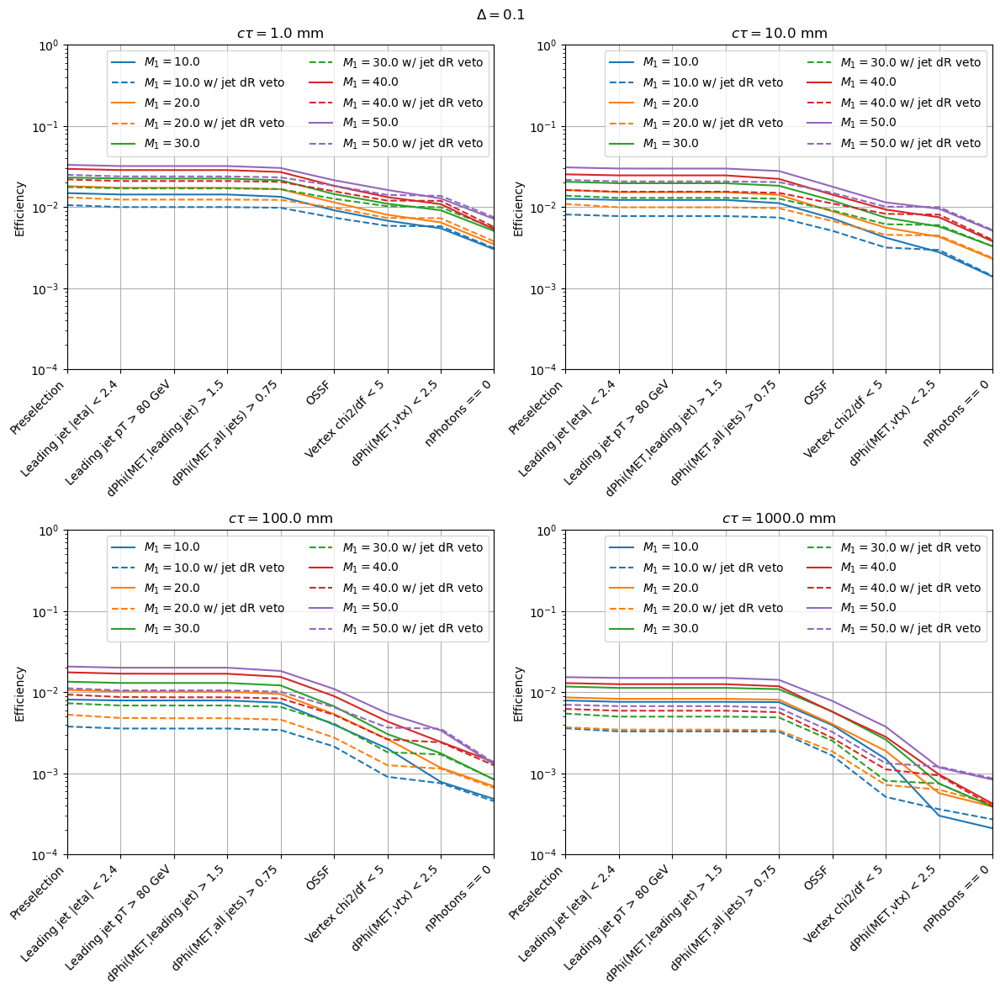

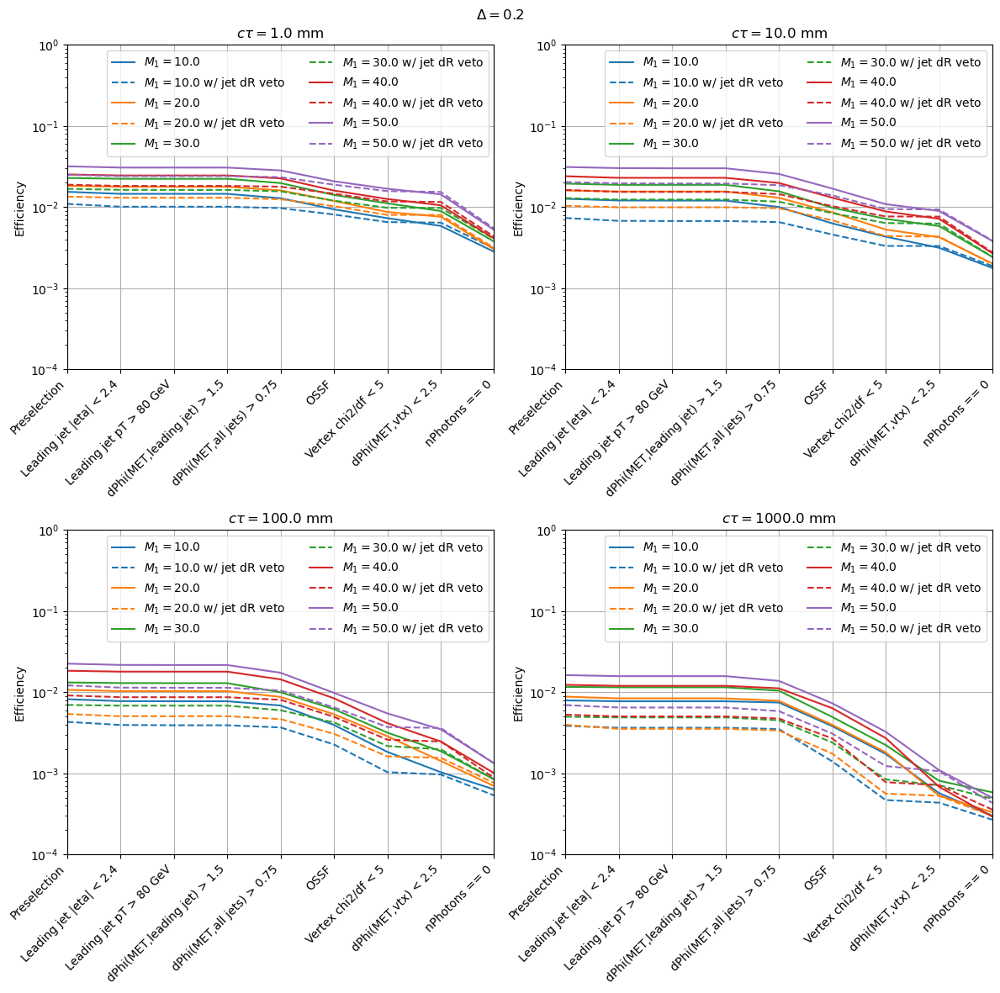

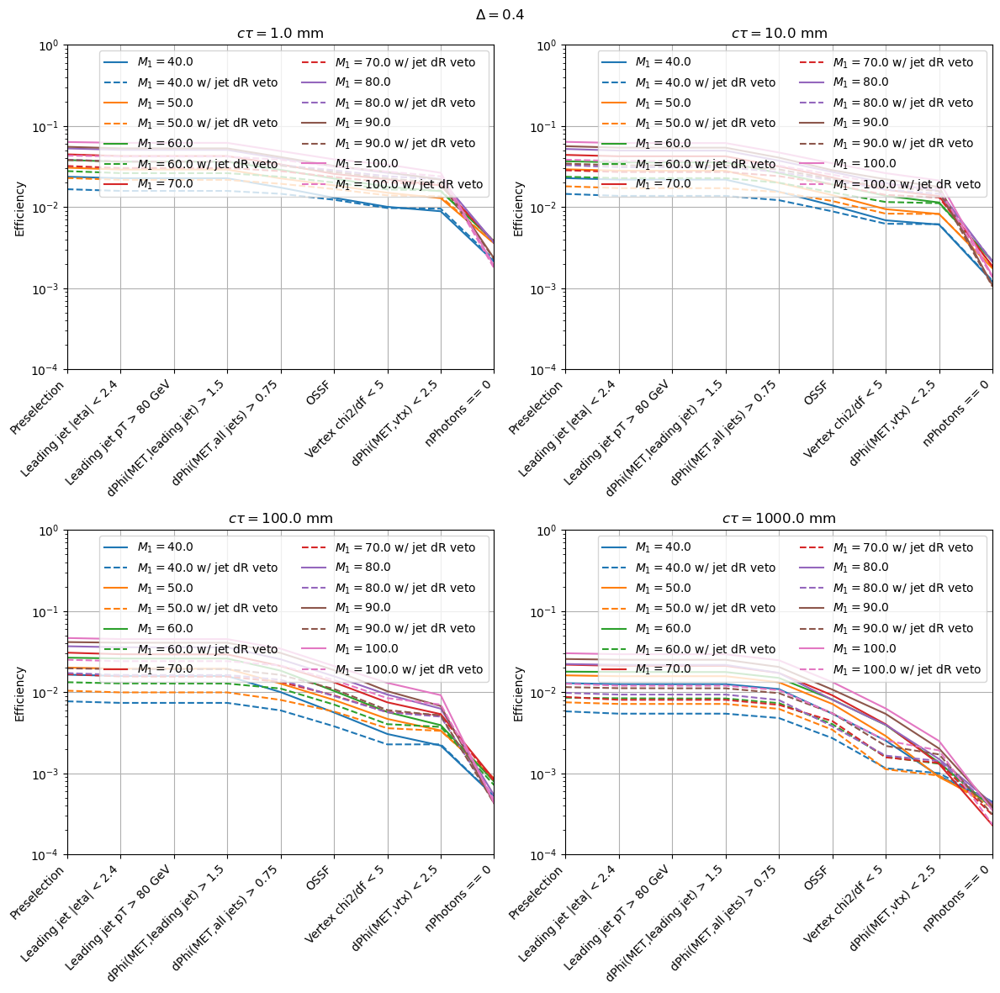

In [22]:
# signal efficiencies by delta/ctau
cf_s = sig['cutflow']
cf_s_rej = sig_rej['cutflow']
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for j,m1 in enumerate(m1s):
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [cf_s[pt][cut] for cut in cuts]
            effs_rej = [cf_s_rej[pt][cut] for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1),color=f"C{j}")
            plt.plot(np.arange(len(cuts)),effs_rej,label=r"$M_1 = {0}$ w/ jet dR veto".format(m1),color=f"C{j}",linestyle='--')
        plt.legend(loc='upper right',ncol=2)
        plt.ylim([0.0001,1])
        plt.xlim([0,len(cuts)-1])
        plt.yscale('log')
        plt.ylabel("Efficiency")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_effs_delta{delta:.1f}_jetRejVsDefault.pdf")
    #plt.close()

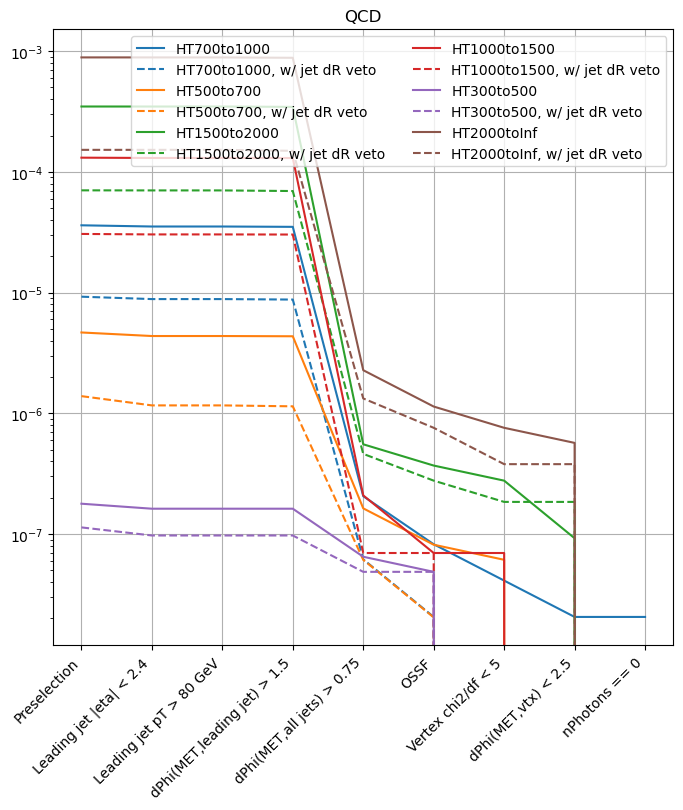

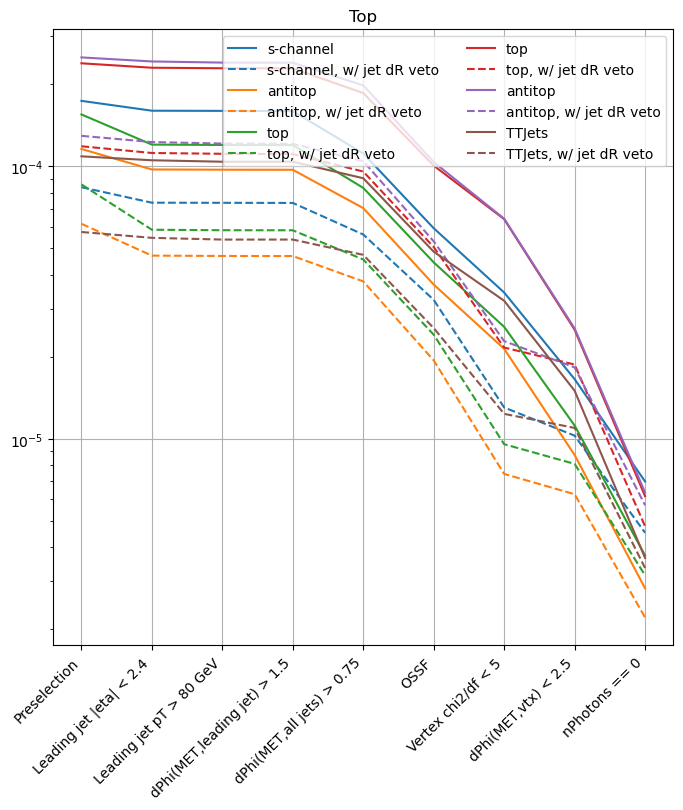

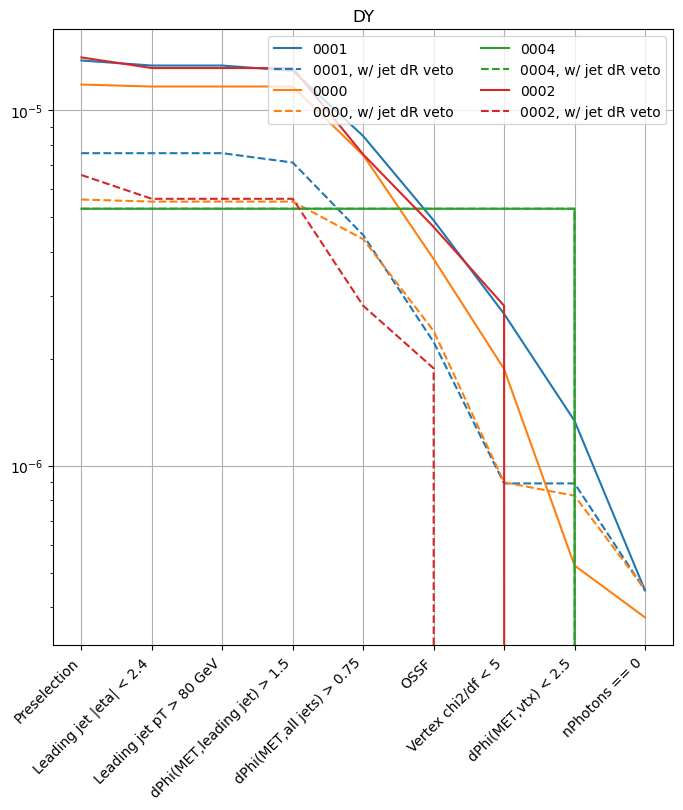

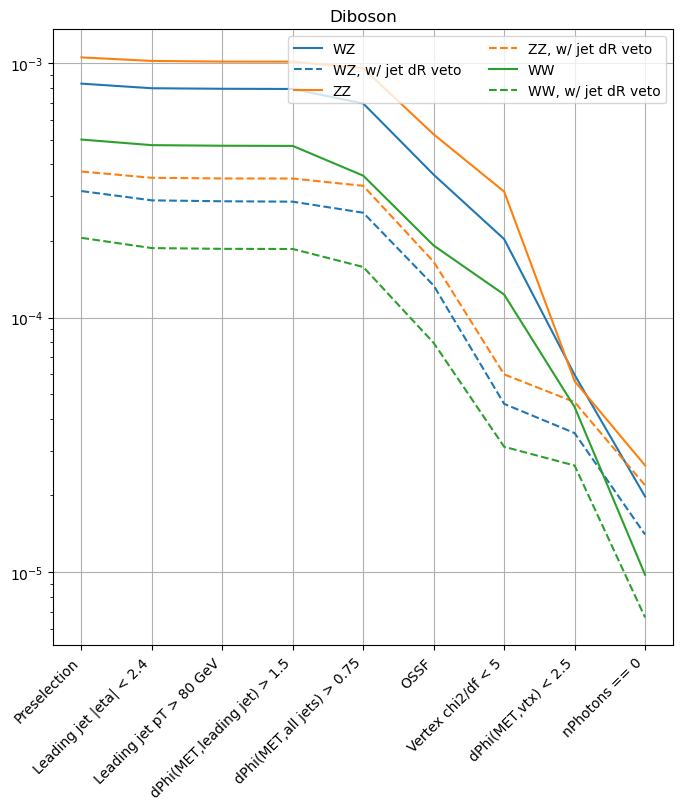

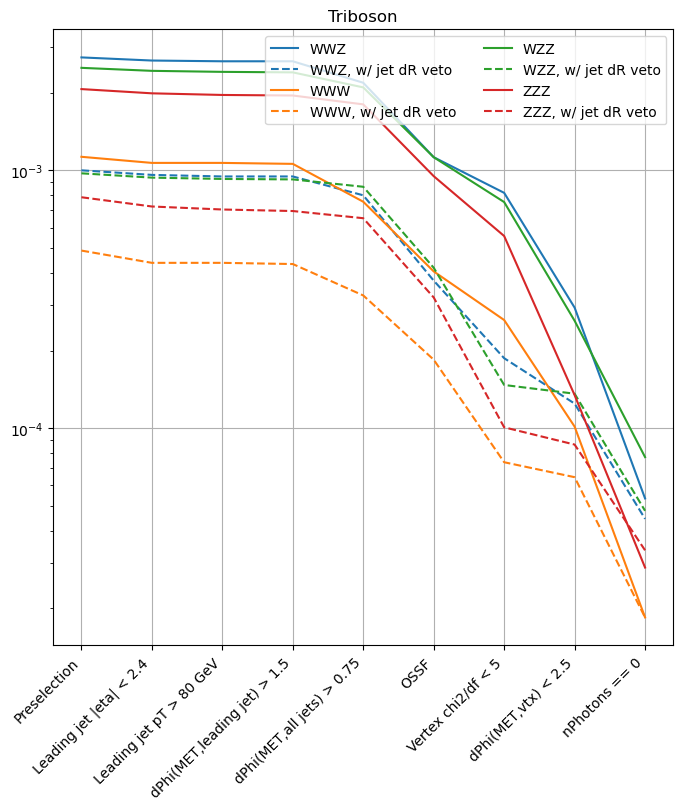

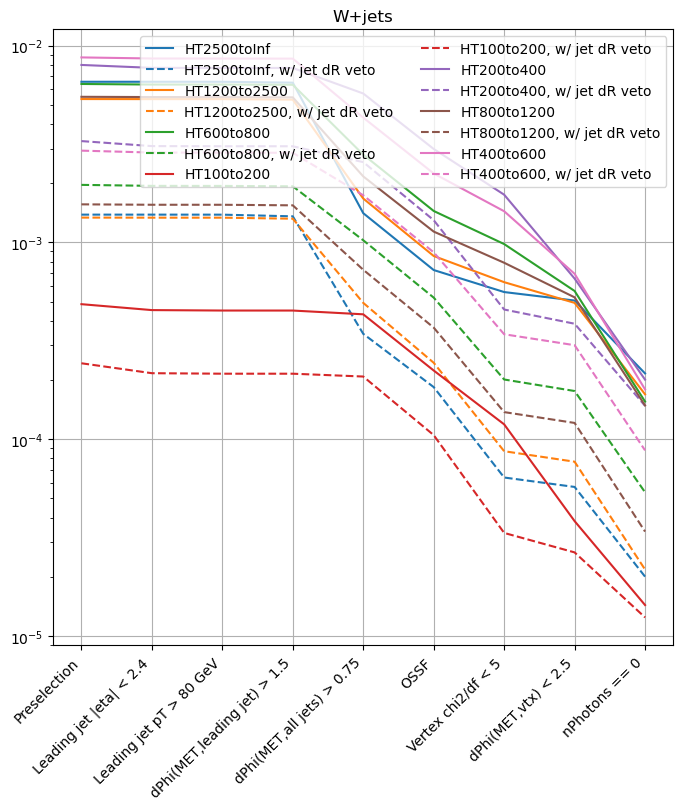

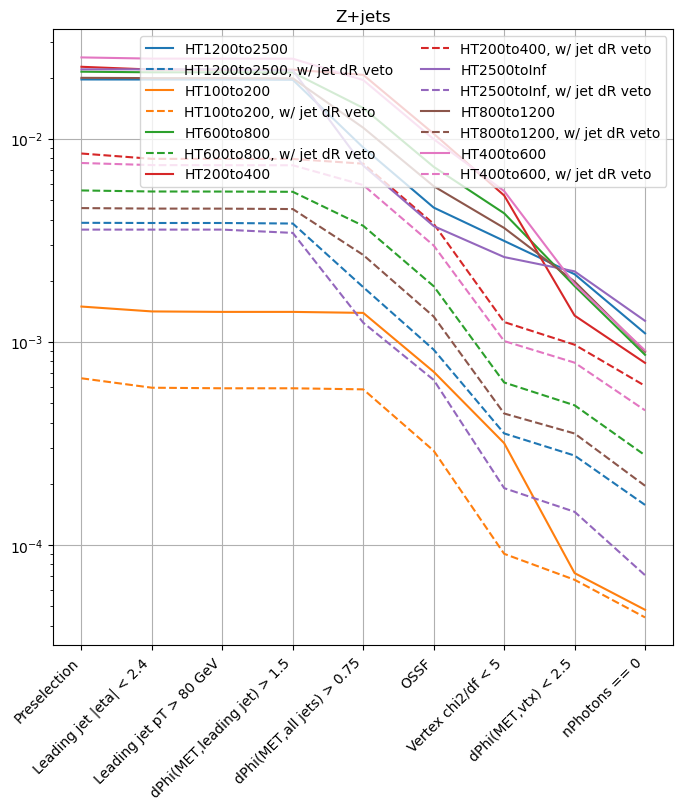

In [23]:
# bkg efficiencies
for b in bkg['cutflow'].keys():
    cfbs = bkg['cutflow'][b]
    cfbs_rej = bkg_rej['cutflow'][b]
    plt.figure(figsize=(8,8))
    plt.title(b)
    subsamples = list(cfbs.keys())
    for i,bkg_pt in enumerate(subsamples):
        cf = cfbs[bkg_pt]
        cf_rej = cfbs_rej[bkg_pt]
        effs = [cf[c] for c in cuts]
        effs_rej = [cf_rej[c] for c in cuts]
        plt.plot(np.arange(len(effs)),effs,label=bkg_pt.split("_")[-1],color=f"C{i}")
        plt.plot(np.arange(len(effs)),effs_rej,label=bkg_pt.split("_")[-1]+", w/ jet dR veto",color=f"C{i}",linestyle='--')
    #plt.ylim([1e-12,1])
    plt.yscale('log')
    plt.legend(loc='upper right',ncol=2)
    plt.grid()
    #plt.xlabel("Cut Number")
    plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
    plt.savefig(f"plots/cutflows/bkg_{b}_cutflow_jetRejVsDefault.pdf")
    #plt.close()

In [31]:
bkg['cutflow_cts']["QCD"]

{'bkg_2018_QCD_HT700to1000': defaultdict(float,
             {'initial': 13740.856149338368,
              'cut7': 13427.137972412835,
              'cut8': 13427.137972412835,
              'cut9': 13340.865473758313,
              'cut10': 78.42954423138337,
              'cut11': 31.371817692553353,
              'cut12': 15.685908846276677,
              'cut13': 7.842954423138338,
              'cut14': 7.842954423138338}),
 'bkg_2018_QCD_HT500to700': defaultdict(float,
             {'initial': 8664.5033045044,
              'cut7': 8096.959419929875,
              'cut8': 8096.959419929875,
              'cut9': 8059.123160958241,
              'cut10': 302.69007177307947,
              'cut11': 151.34503588653973,
              'cut12': 113.5087769149048,
              'cut13': 0.0,
              'cut14': 0.0}),
 'bkg_2018_QCD_HT1500to2000': defaultdict(float,
             {'initial': 2255.0805046215974,
              'cut7': 2253.8825866908555,
              'cut8': 2253.882586

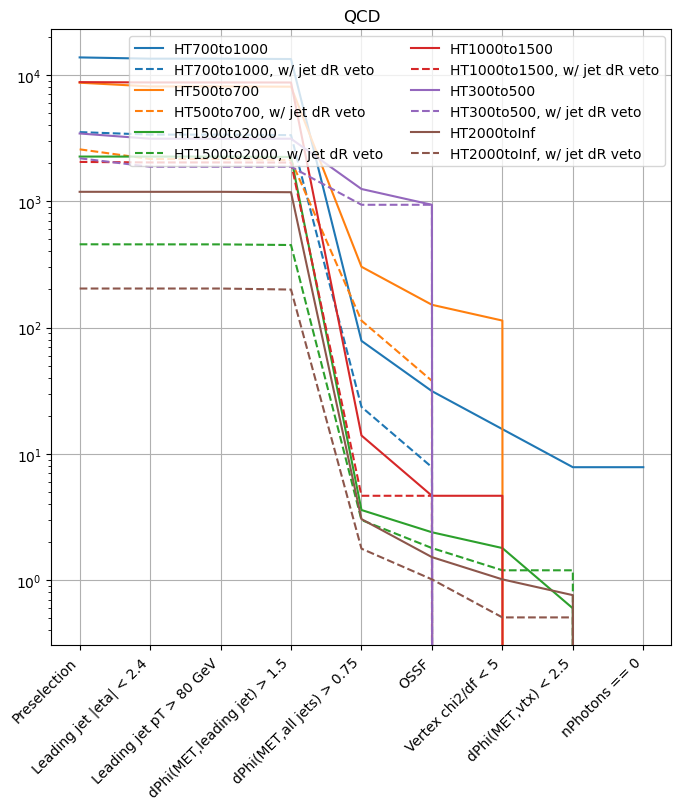

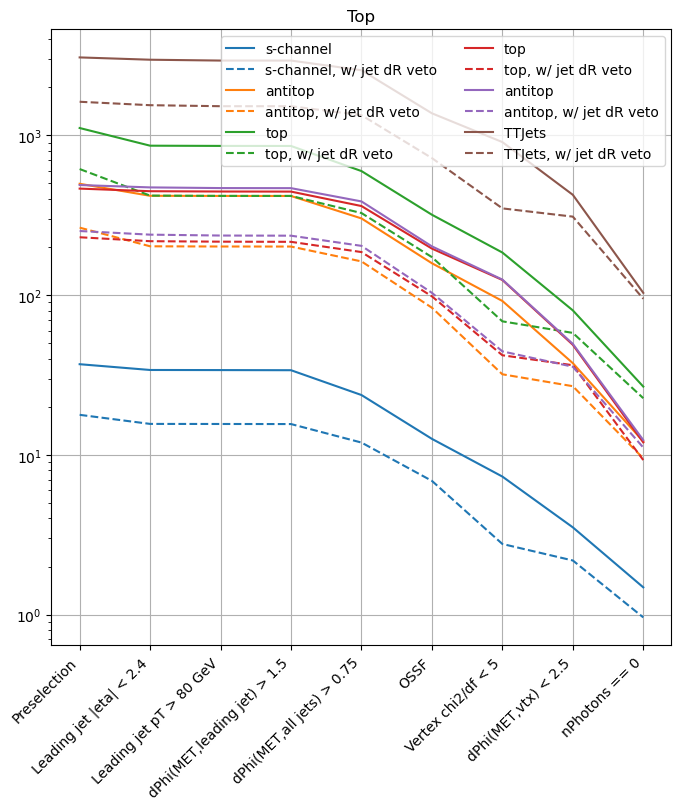

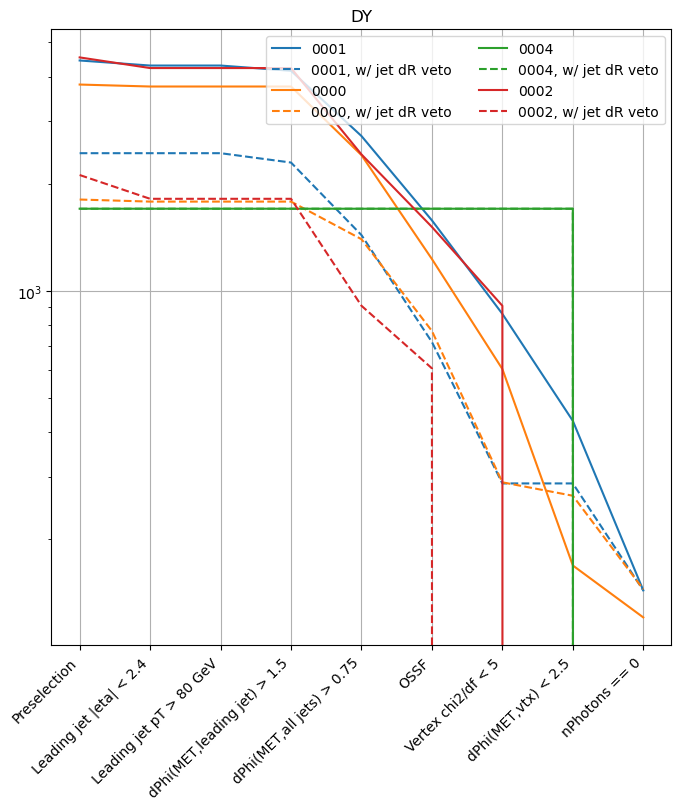

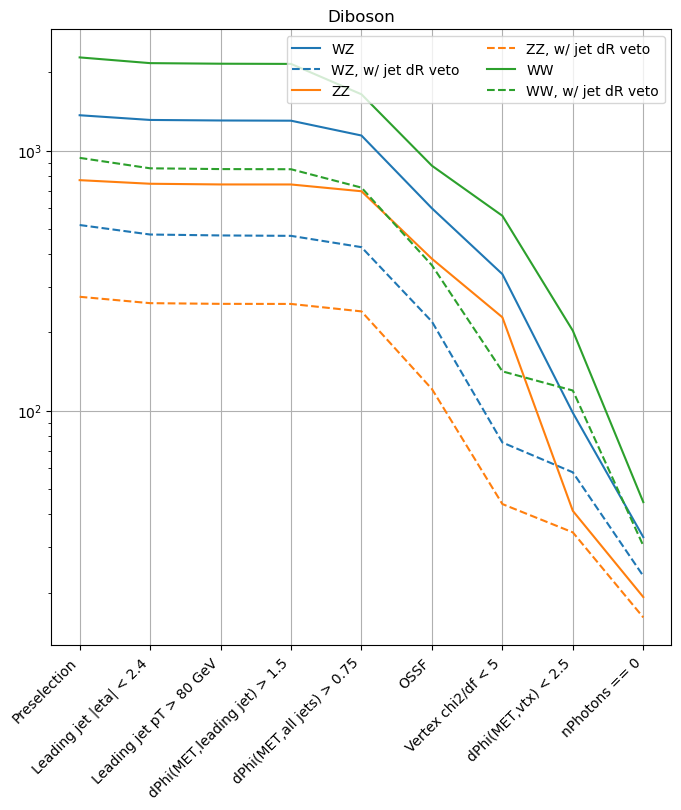

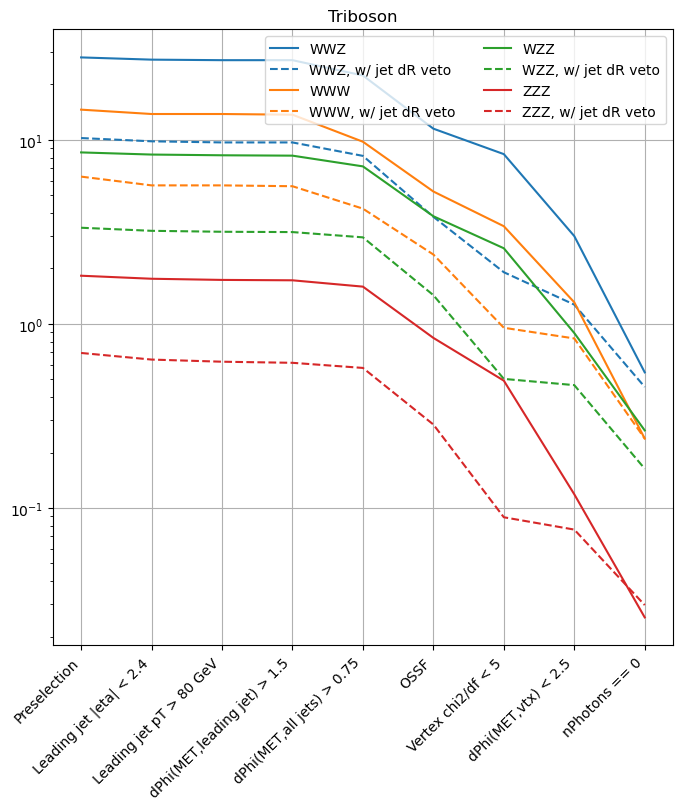

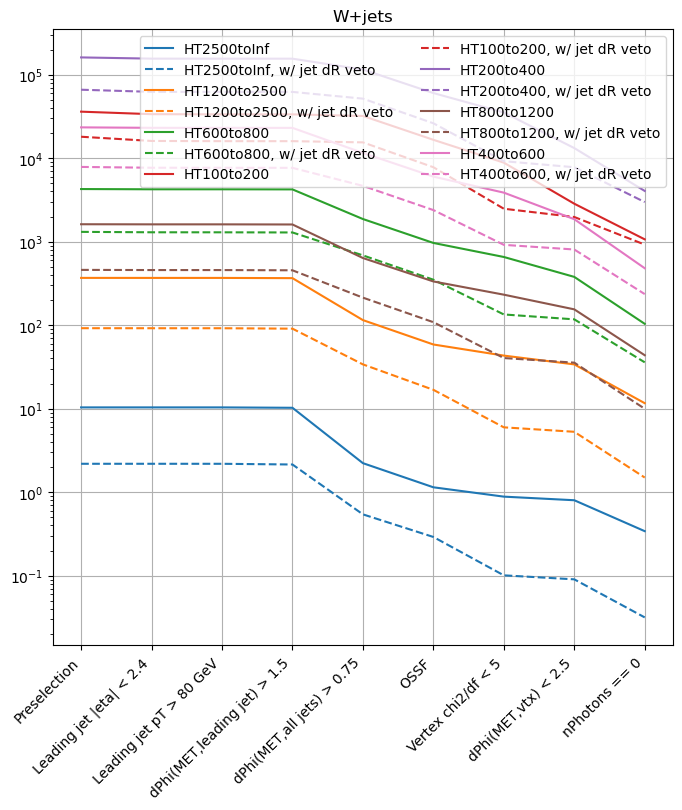

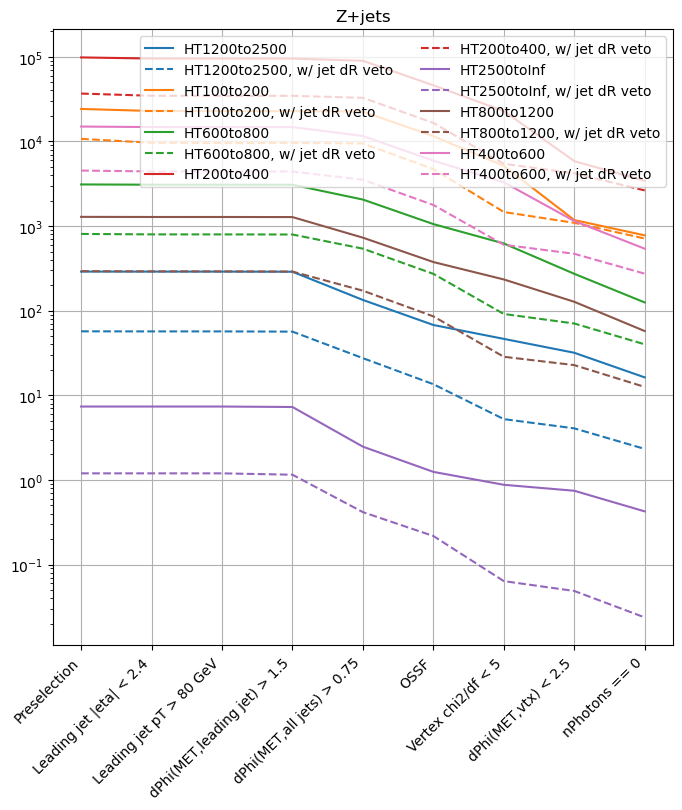

In [30]:
# bkg efficiencies
for b in bkg['cutflow_cts'].keys():
    cfbs = bkg['cutflow_cts'][b]
    cfbs_rej = bkg_rej['cutflow_cts'][b]
    plt.figure(figsize=(8,8))
    plt.title(b)
    subsamples = list(cfbs.keys())
    for i,bkg_pt in enumerate(subsamples):
        cf = cfbs[bkg_pt]
        cf_rej = cfbs_rej[bkg_pt]
        effs = [cf[c] for c in cuts]
        effs_rej = [cf_rej[c] for c in cuts]
        plt.plot(np.arange(len(effs)),effs,label=bkg_pt.split("_")[-1],color=f"C{i}")
        plt.plot(np.arange(len(effs)),effs_rej,label=bkg_pt.split("_")[-1]+", w/ jet dR veto",color=f"C{i}",linestyle='--')
    #plt.ylim([1e-12,1])
    plt.yscale('log')
    plt.legend(loc='upper right',ncol=2)
    plt.grid()
    #plt.xlabel("Cut Number")
    plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
    plt.savefig(f"plots/cutflows/bkg_{b}_cutflow_counts_jetRejVsDefault.pdf")
    #plt.close()

In [28]:
tot_bkg_cts = {}
for b in bkg['cutflow_cts'].keys():
    cfd = bkg['cutflow_cts'][b]
    cts_dict = {k:0 for k in cuts}
    for k in cfd.keys():
        for c in cuts:
            cts_dict[c] += cfd[k][c]
    tot_bkg_cts[b] = cts_dict
bkg_summed_cts = {c:sum([tot_bkg_cts[b][c] for b in tot_bkg_cts.keys()]) for c in cuts}

tot_bkg_cts_rej = {}
for b in bkg_rej['cutflow_cts'].keys():
    cfd = bkg_rej['cutflow_cts'][b]
    cts_dict = {k:0 for k in cuts}
    for k in cfd.keys():
        for c in cuts:
            cts_dict[c] += cfd[k][c]
    tot_bkg_cts_rej[b] = cts_dict
bkg_summed_cts_rej = {c:sum([tot_bkg_cts_rej[b][c] for b in tot_bkg_cts_rej.keys()]) for c in cuts}

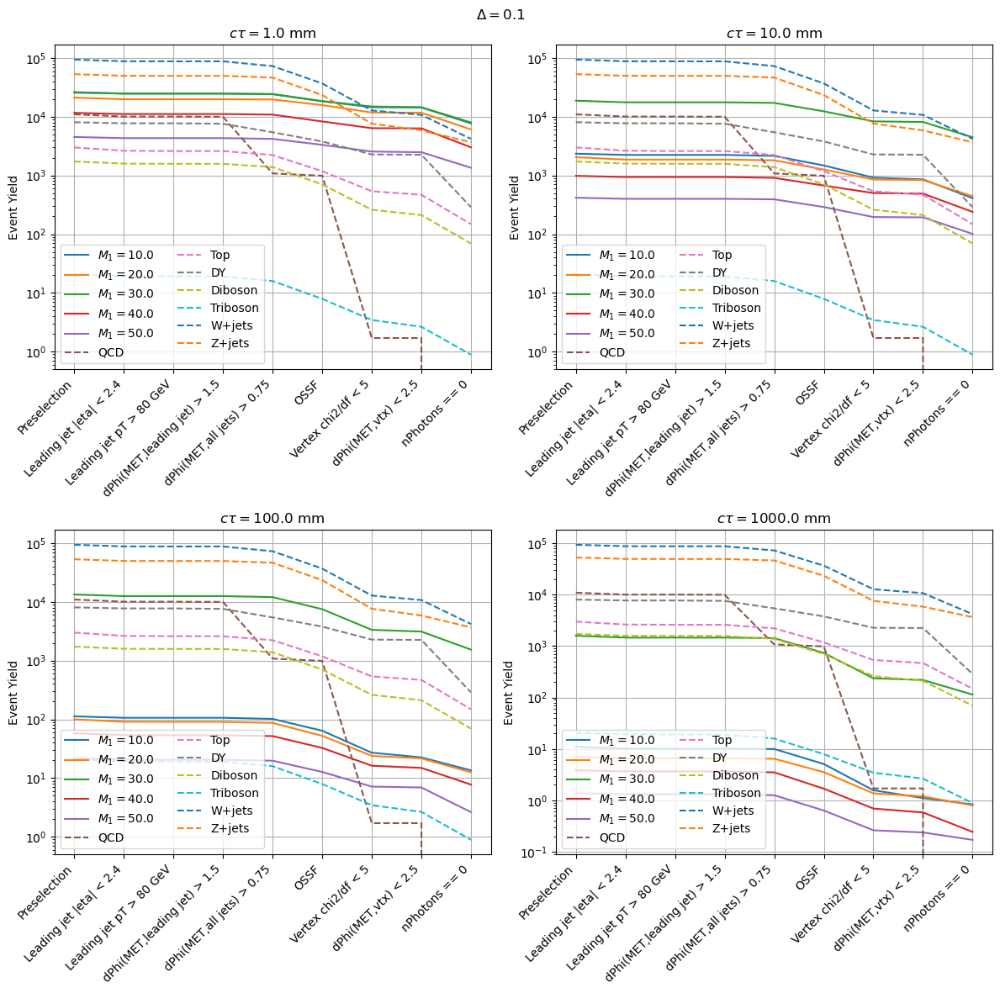

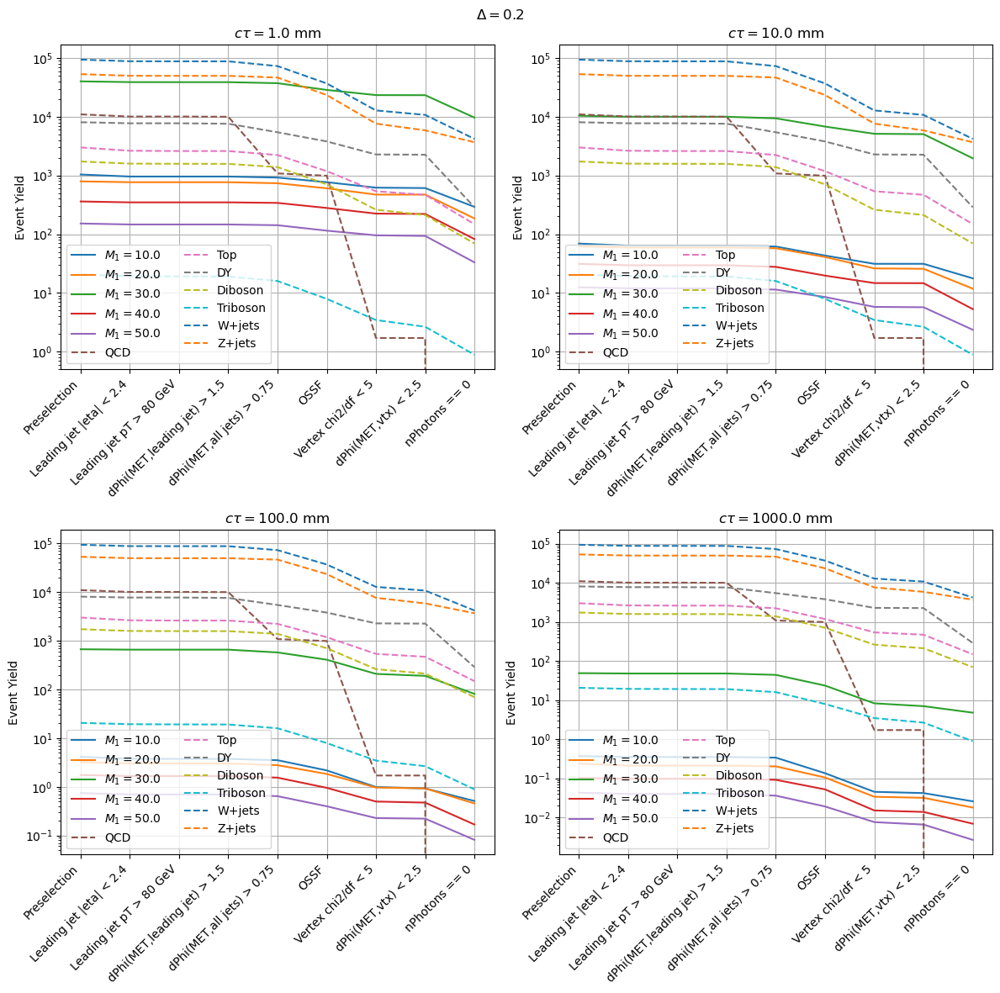

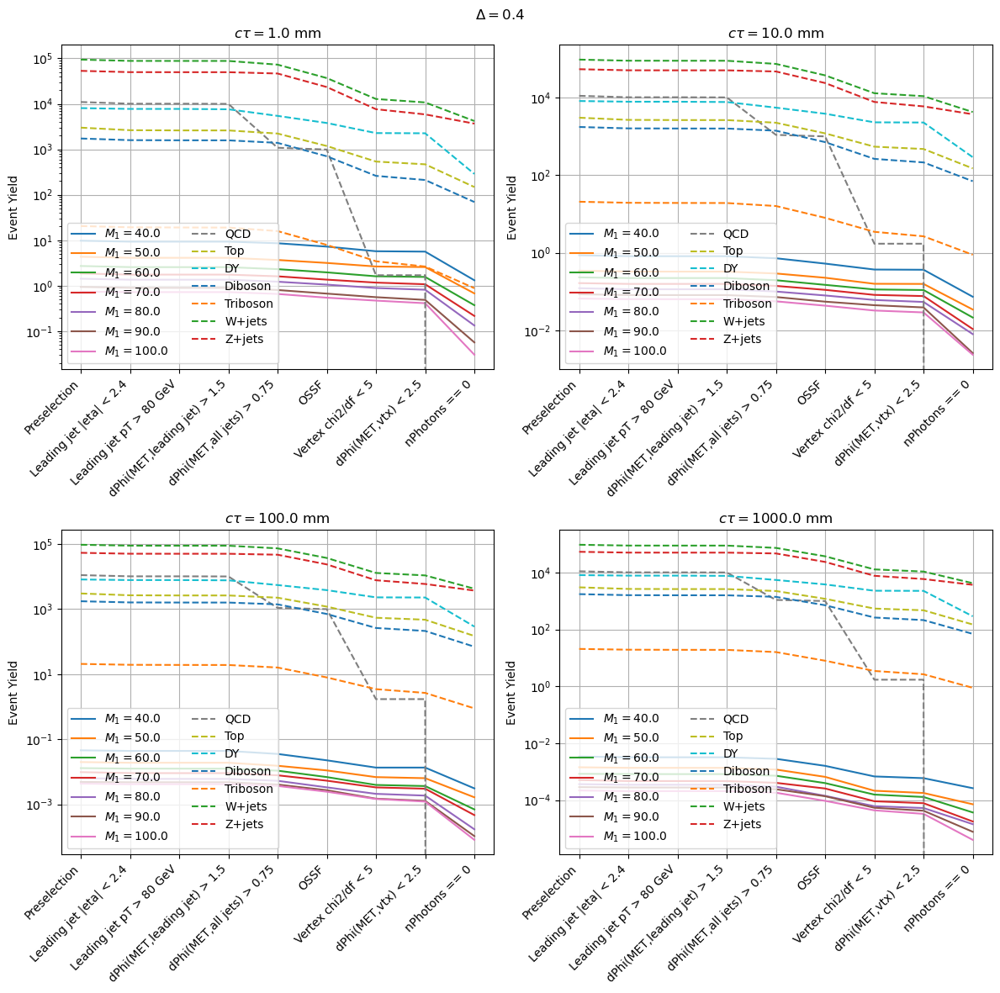

In [29]:
# sig vs bkg event yields, split by bkg type
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [sig_rej['cutflow_cts'][pt][cut] for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1))
        for b in tot_bkg_cts.keys():
            plt.plot(np.arange(len(cuts)),[tot_bkg_cts_rej[b][cut] for cut in cuts],label=b,linestyle='--')
        plt.legend(loc='lower left',ncol=2)
        #plt.ylim([1e-2,1e6])
        #plt.xlim([3,11])
        plt.yscale('log')
        plt.ylabel("Event Yield")
        #plt.xlabel("Cut Number")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_vs_itemizedBkg_counts_delta{delta:.1f}_jetRej.pdf")
    #plt.close()

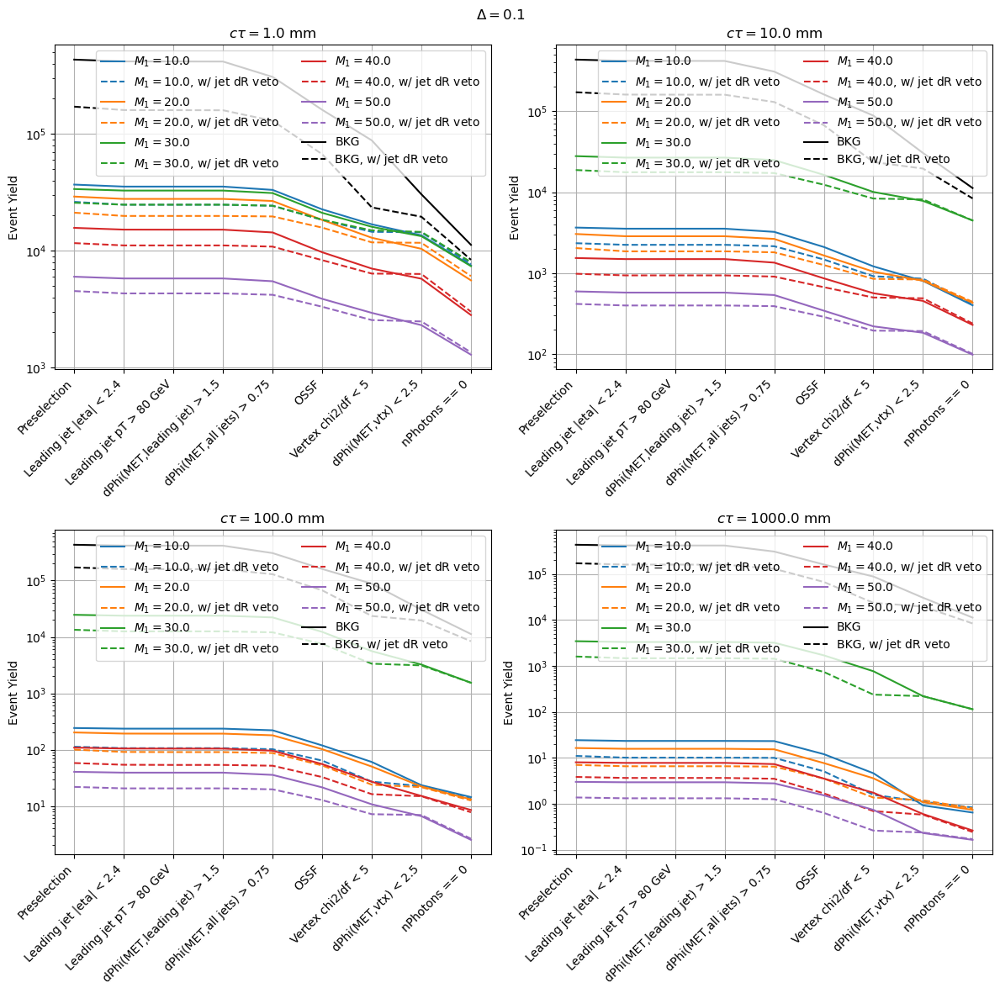

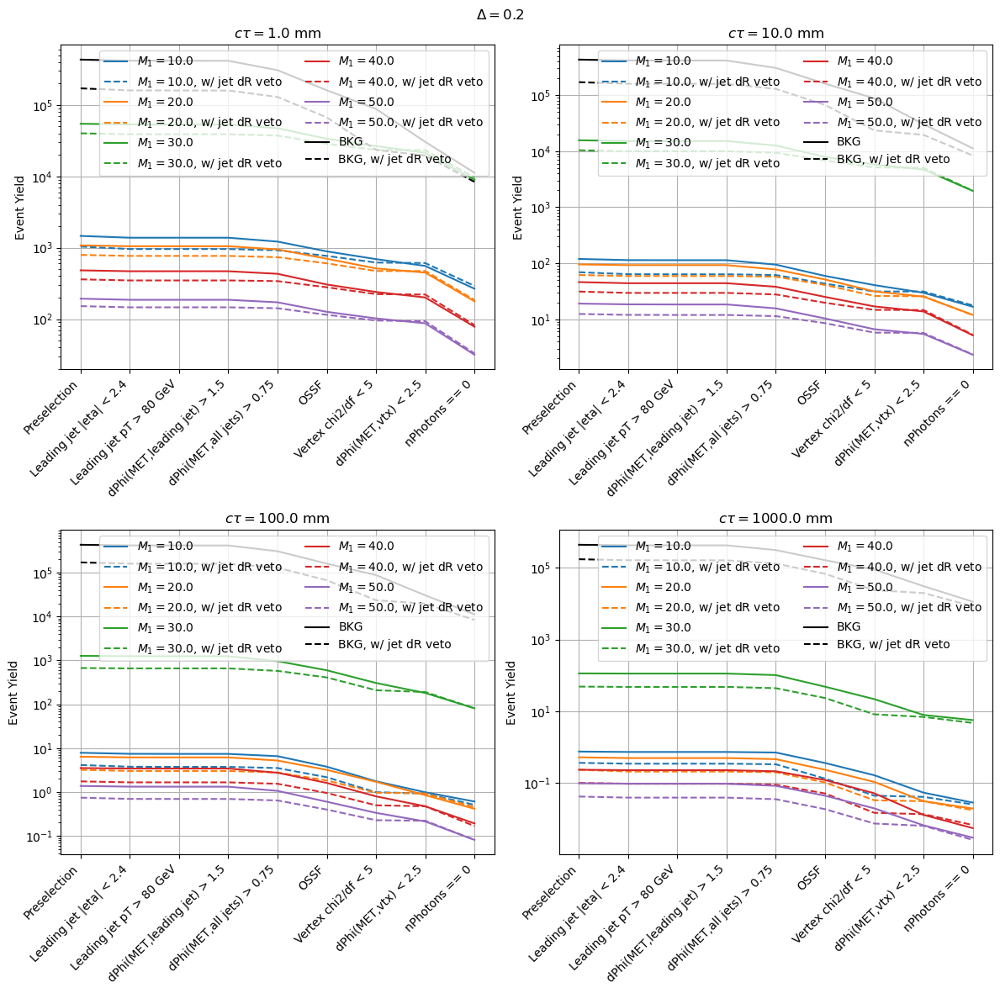

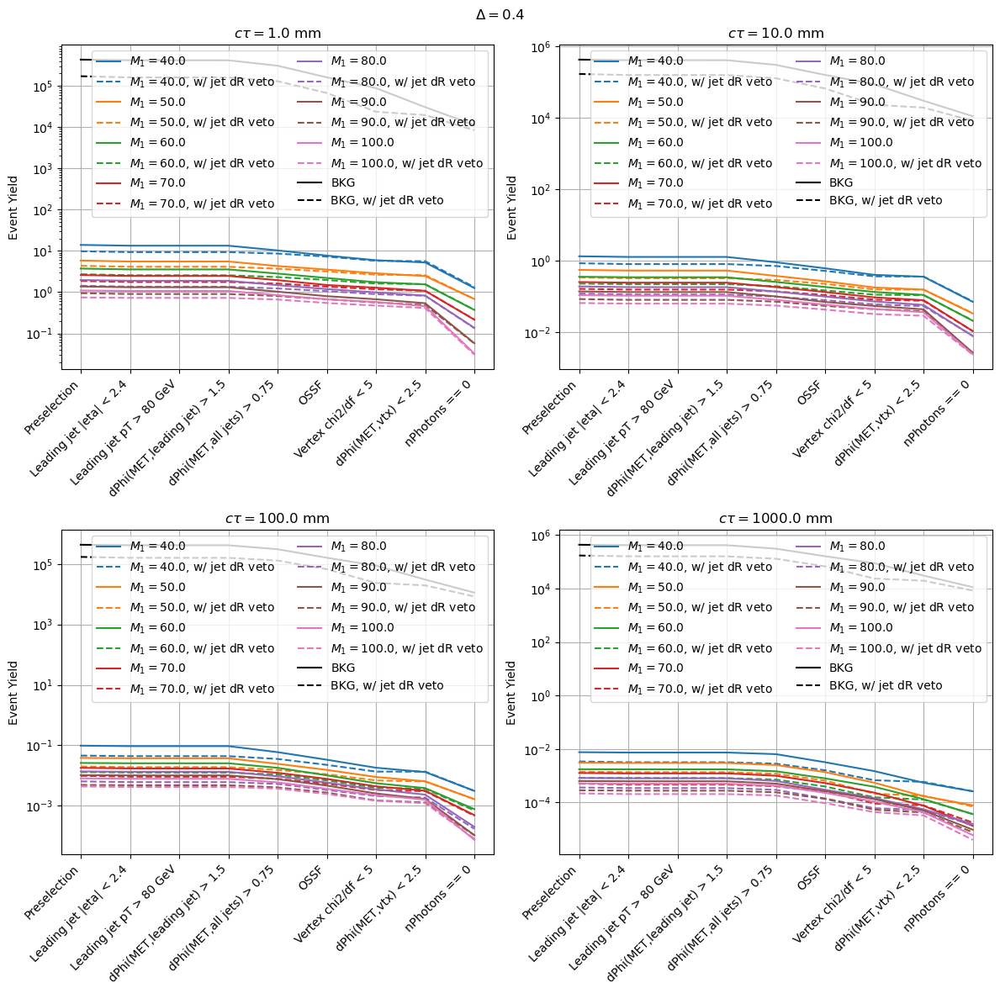

In [26]:
# sig vs bkg event yields, bkg lumped together
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for j,m1 in enumerate(m1s):
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [sig['cutflow_cts'][pt][cut] for cut in cuts]
            effs_rej = [sig_rej['cutflow_cts'][pt][cut] for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1),color=f"C{j}")
            plt.plot(np.arange(len(cuts)),effs_rej,label=r"$M_1 = {0}$, w/ jet dR veto".format(m1),color=f"C{j}",linestyle='--')
        plt.plot(np.arange(len(cuts)),[bkg_summed_cts[cut] for cut in cuts],label="BKG",linestyle='-',color='k')
        plt.plot(np.arange(len(cuts)),[bkg_summed_cts_rej[cut] for cut in cuts],label="BKG, w/ jet dR veto",linestyle='--',color='k')
        plt.legend(loc='upper right',ncol=2)
        #plt.ylim([1e-2,1e6])
        #plt.xlim([3,11])
        plt.yscale('log')
        plt.ylabel("Event Yield")
        #plt.xlabel("Cut Number")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_vs_bkg_counts_delta{delta:.1f}_jetRejVsDefault.pdf")
    #plt.close()

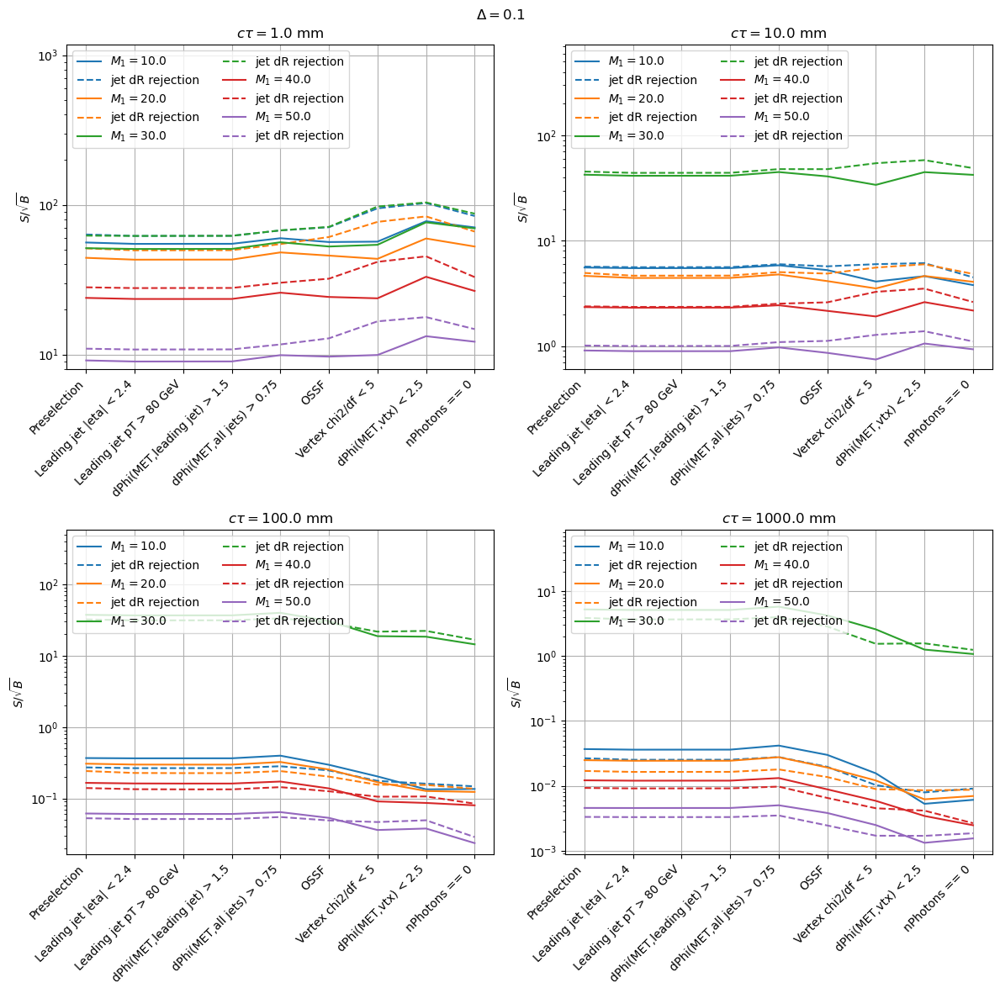

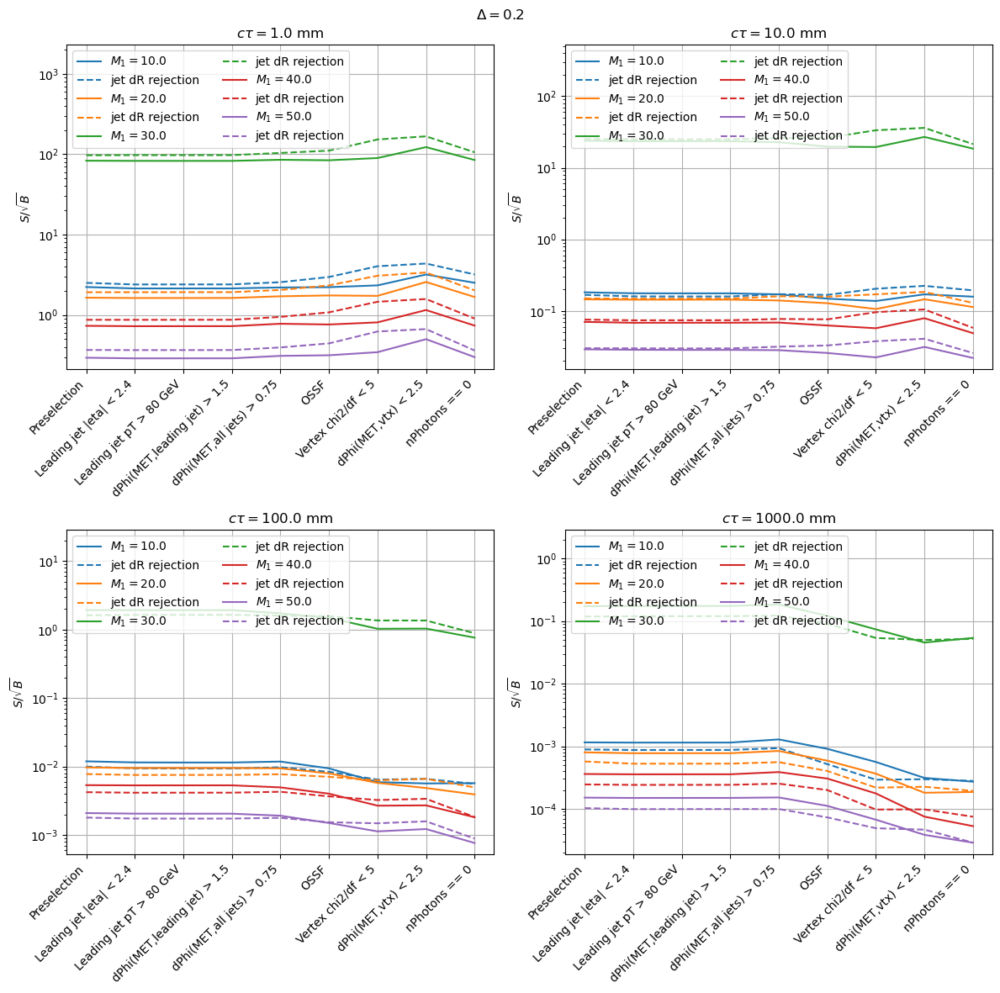

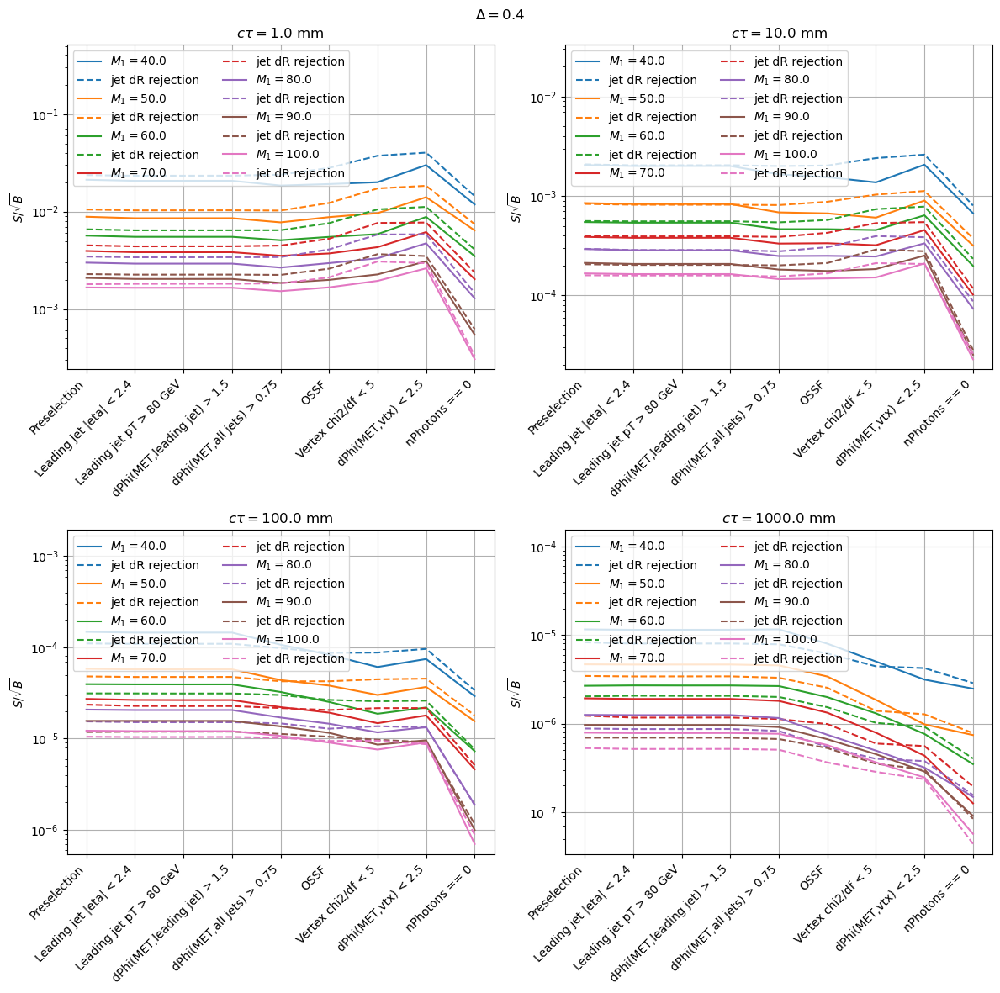

In [27]:
# S/sqrt(B)
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for j,m1 in enumerate(m1s):
            pt = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            effs = [sig['cutflow_cts'][pt][cut]/np.sqrt(bkg_summed_cts[cut]) for cut in cuts]
            effs_rej = [sig_rej['cutflow_cts'][pt][cut]/np.sqrt(bkg_summed_cts_rej[cut]) for cut in cuts]
            plt.plot(np.arange(len(cuts)),effs,label=r"$M_1 = {0}$".format(m1),color=f"C{j}")
            plt.plot(np.arange(len(cuts)),effs_rej,label=r"jet dR rejection".format(m1),color=f"C{j}",linestyle='--')
        plt.legend(loc='upper left',ncol=2)
        plt.yscale('log')
        ylim = plt.gca().get_ylim()
        plt.ylim([ylim[0],10*ylim[1]])
        plt.ylabel(r"$S/\sqrt{B}$")
        plt.xticks(ticks=np.arange(len(cuts)),labels=[cutNames[c] for c in cuts],rotation=45,ha='right')
        plt.grid()
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
    plt.savefig(f"plots/cutflows/signal_signif_delta{delta:.1f}_jetRejVsDefault.pdf")
    #plt.close()